<a href="https://colab.research.google.com/github/Covpet/Applied-Data-Science-1/blob/main/plant_disease_detection_(cassava_and_maize).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install keras-tuner --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 5.0 MB/s eta 0:00:00


### Import Important libraries from the python package

In [3]:
import os
import cv2

import matplotlib.pyplot as plt
import numpy as np
import random
from PIL import Image
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
import pandas as pd
import shutil
import tensorflow as tf
from PIL import ImageFile
import keras_tuner as kt
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D , Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import metrics
from tensorflow.keras.applications import MobileNetV2, ResNet50, VGG16
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications import ResNet50

# Mount Google drive

In [4]:
# Import and mount Google Drive.
from google.colab import drive

drive.mount("/content/drive")


Mounted at /content/drive


# DATA PREPROCESSING

# Base directory structure for maize, Clean up was done for maize due to corrupted images

Displaying images from folder: fall armyworm


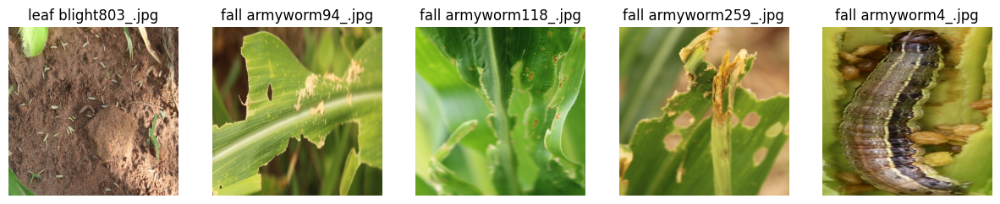

Displaying images from folder: grasshoper


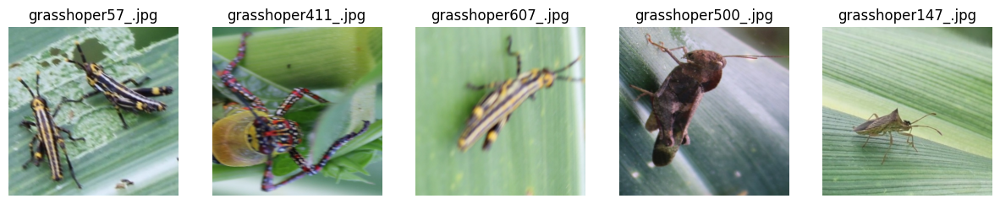

Displaying images from folder: healthy


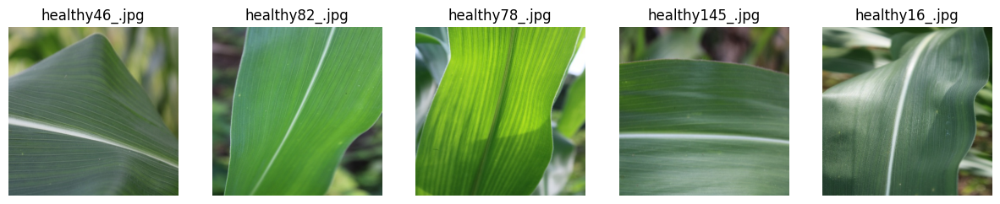

Displaying images from folder: leaf beetle


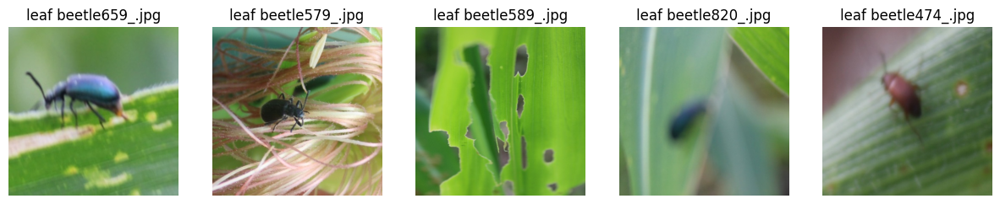

Displaying images from folder: leaf blight


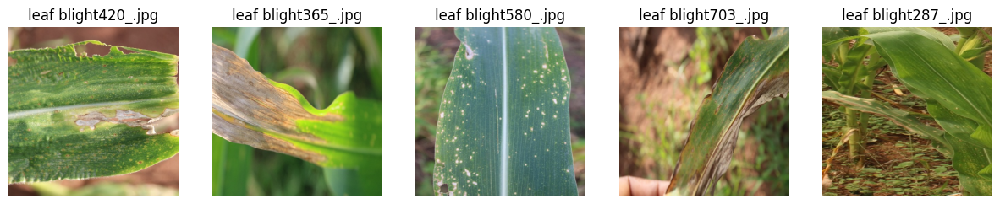

Displaying images from folder: leaf spot


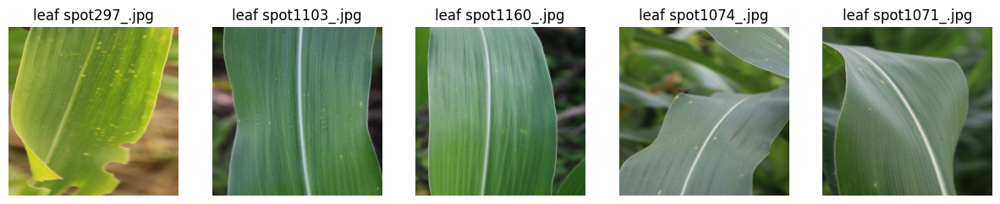

Displaying images from folder: streak virus


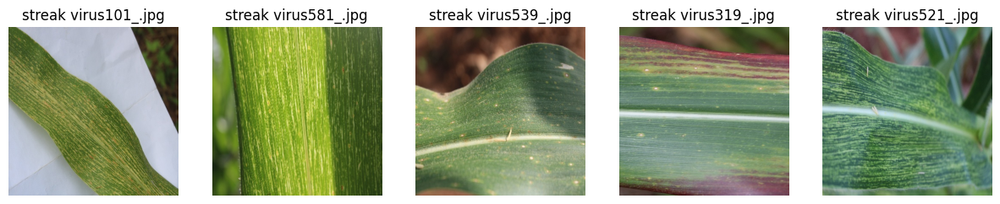

In [5]:
# Define base directory and folder names
base_dir = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Maize'
folders = ['fall armyworm', 'grasshoper', 'healthy', 'leaf beetle', 'leaf blight', 'leaf spot', 'streak virus']

# Function to check if a file is a valid image
def is_valid_image(file_path):
    try:
        with Image.open(file_path) as img:
            img.verify()  # Verify if the file is a valid image
        return True
    except (IOError, SyntaxError) as e:
        return False

# Function to remove invalid image files
def remove_invalid_images(folder_path):
    files = os.listdir(folder_path)
    for file in files:
        file_path = os.path.join(folder_path, file)
        if not is_valid_image(file_path):
            print(f"Removing invalid file: {file}")
            os.remove(file_path)

# Function to display a sample of 5 images from each folder
def display_images_from_folders(base_dir, folders, num_images=5):
    for folder in folders:
        folder_path = os.path.join(base_dir, folder)
        print(f"Displaying images from folder: {folder}")

        # Remove invalid images before displaying
        remove_invalid_images(folder_path)

        # Get all valid image files in the folder after cleanup
        files = [f for f in os.listdir(folder_path) if is_valid_image(os.path.join(folder_path, f))]

        if len(files) < num_images:
            print(f"Not enough valid images in {folder}. Found only {len(files)} valid images.")
            continue

        # Randomly select images to display
        selected_files = random.sample(files, num_images)

        # Create a subplot to display images
        fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

        for i, file in enumerate(selected_files):
            img_path = os.path.join(folder_path, file)
            img = Image.open(img_path)
            axes[i].imshow(img)
            axes[i].axis('off')
            axes[i].set_title(file)

        plt.show()

# Call the function to display images and remove invalid ones
display_images_from_folders(base_dir, folders)

#  Directory structure for cassava


                                          image_path             class
0  /content/drive/MyDrive/Raw Data/CCMT Dataset/C...  bacterial blight
1  /content/drive/MyDrive/Raw Data/CCMT Dataset/C...  bacterial blight
2  /content/drive/MyDrive/Raw Data/CCMT Dataset/C...  bacterial blight
3  /content/drive/MyDrive/Raw Data/CCMT Dataset/C...  bacterial blight
4  /content/drive/MyDrive/Raw Data/CCMT Dataset/C...  bacterial blight


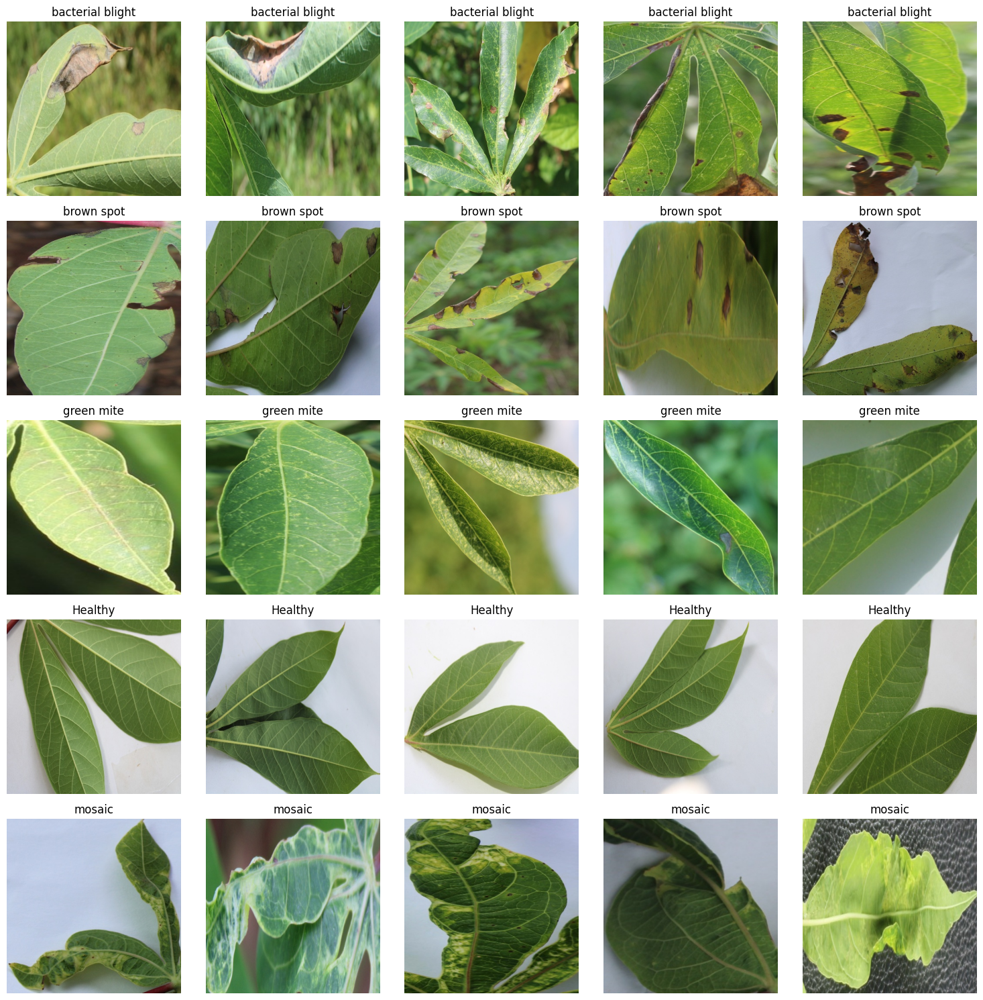

In [6]:
# Directory structure
base_dir = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Cassava'
folders = [
    'bacterial blight', 'brown spot', 'green mite', 'Healthy', 'mosaic']

# List to store image paths and their corresponding classes
image_paths = []
image_classes = []

# Iterate through each folder and collect image paths
for folder in folders:
    folder_path = os.path.join(base_dir, folder)
    for filename in os.listdir(folder_path):
        if filename.endswith(('.png', '.jpg', '.jpeg')):  # Adjust if necessary for different image formats
            image_paths.append(os.path.join(folder_path, filename))
            image_classes.append(folder)

# Create a DataFrame
df_images = pd.DataFrame({
    'image_path': image_paths,
    'class': image_classes
})

# Show the DataFrame with image paths and their classes
print(df_images.head())

# Set up a plot to display the images
num_images_per_class = 5  # Show 5 images per class
fig, axes = plt.subplots(nrows=len(folders), ncols=num_images_per_class, figsize=(15, 15))

# Loop through each class and display 5 images
for i, folder in enumerate(folders):
    # Filter images of the current class
    class_images = df_images[df_images['class'] == folder].head(num_images_per_class)

    for j, (image_path, label) in enumerate(zip(class_images['image_path'], class_images['class'])):
        img = Image.open(image_path)
        axes[i, j].imshow(img)
        axes[i, j].axis('off')
        axes[i, j].set_title(label)

plt.tight_layout()
plt.show()

# Maize and Cassava info counts

In [7]:
# Function to load and prepare the DataFrame
def load_data(base_dir, folders):
    image_paths = []
    image_classes = []

    # Iterate through each folder and collect image paths
    for folder in folders:
        folder_path = os.path.join(base_dir, folder)
        for filename in os.listdir(folder_path):
            if filename.endswith(('.png', '.jpg', '.jpeg')):  # Adjust if necessary for different image formats
                image_paths.append(os.path.join(folder_path, filename))
                image_classes.append(folder)

    # Create a DataFrame
    df_images = pd.DataFrame({
        'image_path': image_paths,
        'class': image_classes
    })

    return df_images

# For Maize
base_dir_maize = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Maize'
folders_maize = [
    'fall armyworm', 'grasshoper', 'healthy', 'leaf beetle', 'leaf blight', 'leaf spot', 'streak virus'
]

df_maize = load_data(base_dir_maize, folders_maize)

# For Cassava
base_dir_cassava = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Cassava'
folders_cassava = [
    'bacterial blight', 'brown spot', 'green mite', 'Healthy', 'mosaic'
]

df_cassava = load_data(base_dir_cassava, folders_cassava)

# Count the number of images per class
maize_class_counts = df_maize['class'].value_counts()
cassava_class_counts = df_cassava['class'].value_counts()

# Count the file formats for both datasets
maize_file_formats = df_maize['image_path'].apply(lambda x: x.split('.')[-1]).value_counts()
cassava_file_formats = df_cassava['image_path'].apply(lambda x: x.split('.')[-1]).value_counts()

# Display counts for Maize
print("Maize Class Counts:")
print(maize_class_counts)
print("\nMaize File Format Counts:")
print(maize_file_formats)

# Display counts for Cassava
print("\nCassava Class Counts:")
print(cassava_class_counts)
print("\nCassava File Format Counts:")
print(cassava_file_formats)

Maize Class Counts:
class
leaf spot        1249
streak virus     1002
leaf blight       998
leaf beetle       938
grasshoper        683
fall armyworm     285
healthy           206
Name: count, dtype: int64

Maize File Format Counts:
image_path
jpg    5361
Name: count, dtype: int64

Cassava Class Counts:
class
bacterial blight    2772
brown spot          1506
Healthy             1283
mosaic              1235
green mite          1154
Name: count, dtype: int64

Cassava File Format Counts:
image_path
jpg    7950
Name: count, dtype: int64


# Exploratory data Analysis for maize and cassava

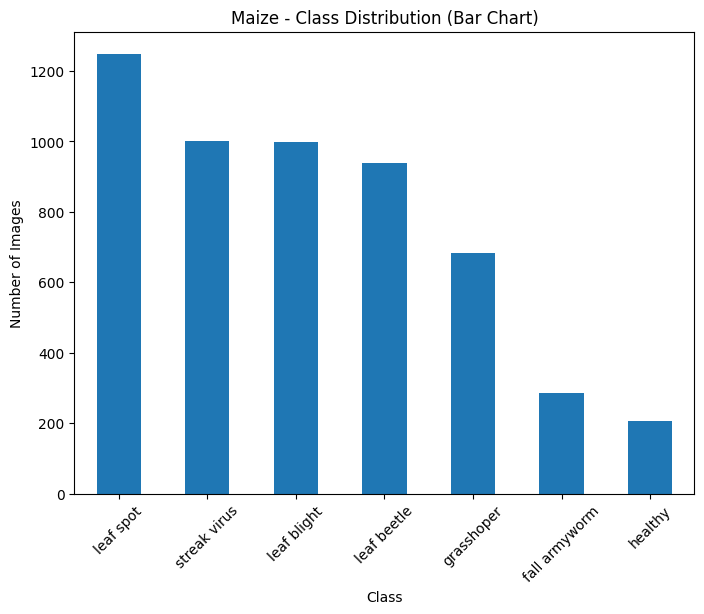

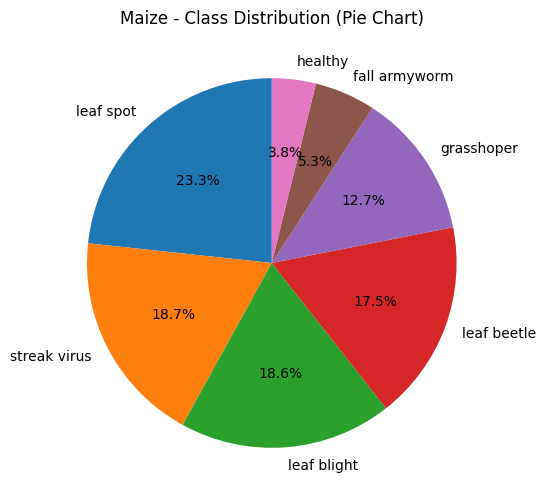

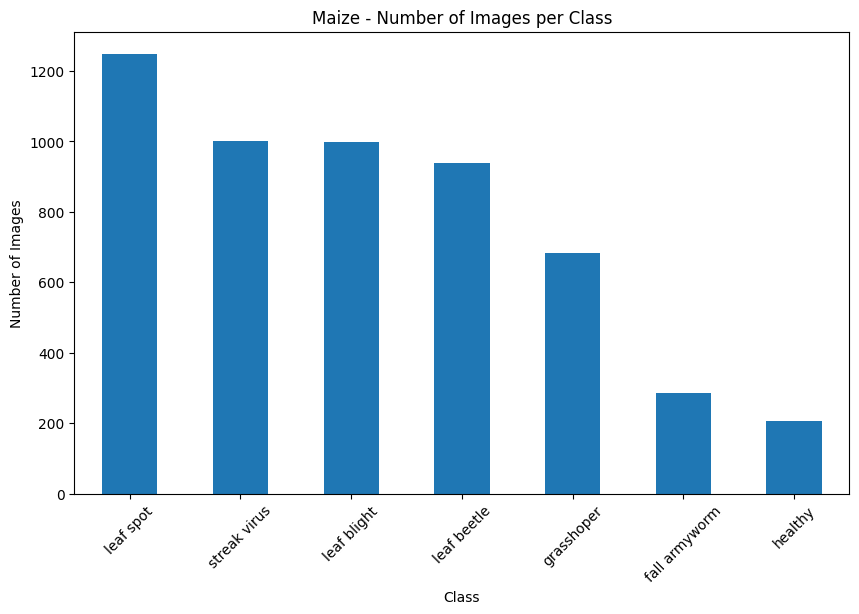

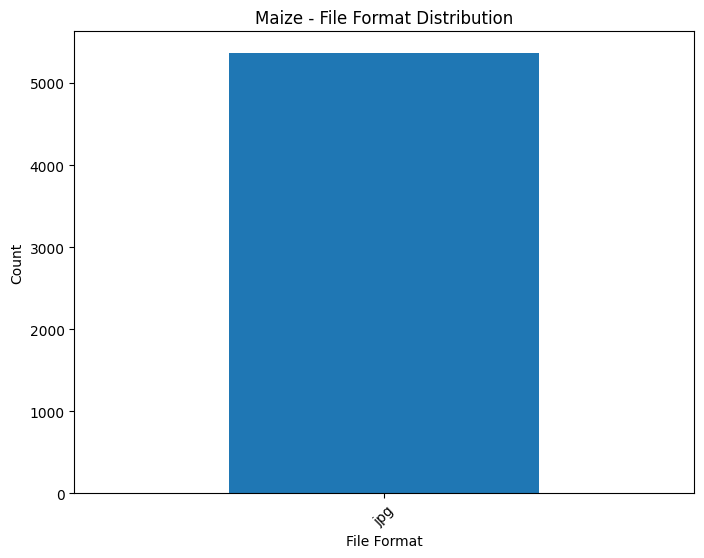

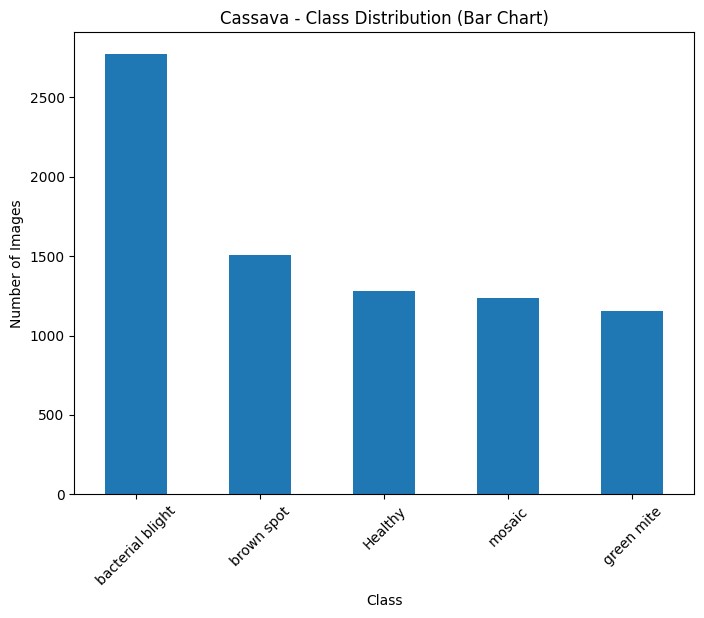

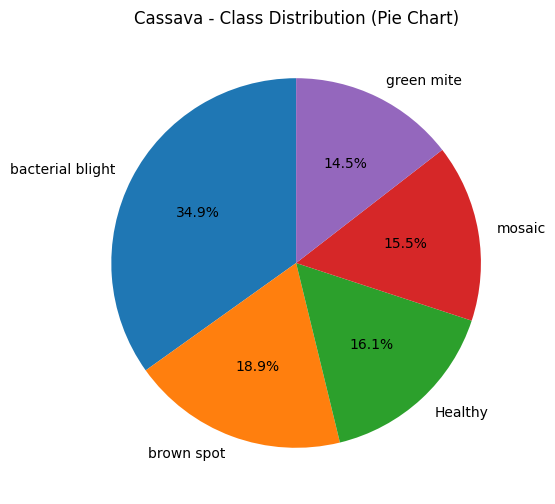

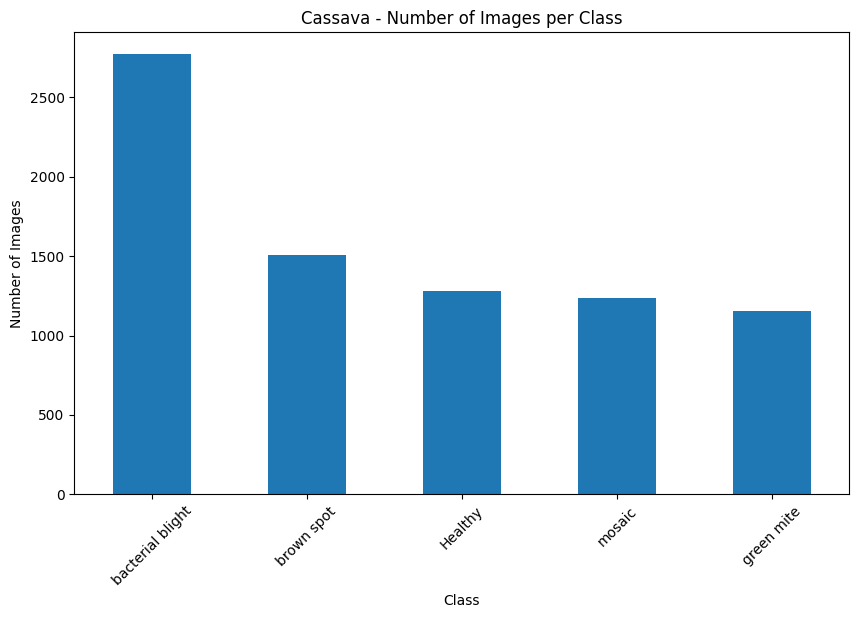

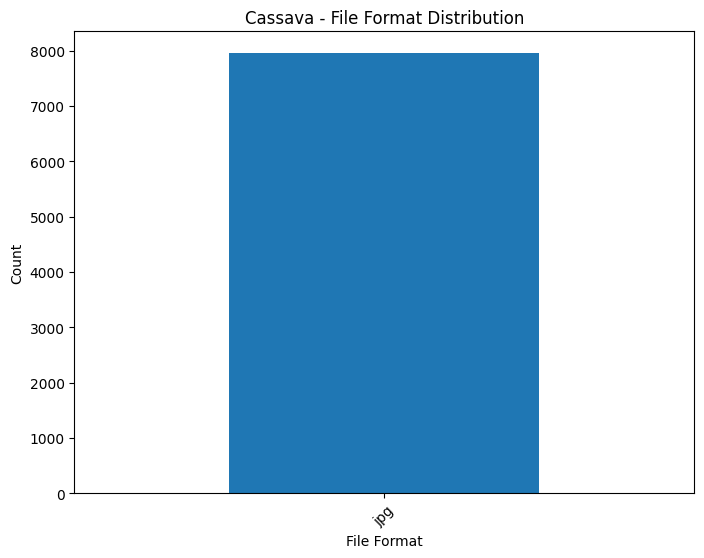

In [8]:
# For Maize
base_dir_maize = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Maize'
folders_maize = [
    'fall armyworm', 'grasshoper', 'healthy', 'leaf beetle', 'leaf blight', 'leaf spot', 'streak virus'
]

df_maize = load_data(base_dir_maize, folders_maize)

# For Cassava
base_dir_cassava = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Cassava'
folders_cassava = [
    'bacterial blight', 'brown spot', 'green mite', 'Healthy', 'mosaic'
]

df_cassava = load_data(base_dir_cassava, folders_cassava)

# EDA for Maize dataset and cassava
def plot_eda(df_images, title):
    # Class distribution (Bar Chart)
    plt.figure(figsize=(8, 6))
    df_images['class'].value_counts().plot(kind='bar')
    plt.title(f'{title} - Class Distribution (Bar Chart)')
    plt.xlabel('Class')
    plt.ylabel('Number of Images')
    plt.xticks(rotation=45)
    plt.show()

    # Class distribution (Pie Chart)
    plt.figure(figsize=(8, 6))
    df_images['class'].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=90)
    plt.title(f'{title} - Class Distribution (Pie Chart)')
    plt.ylabel('')
    plt.show()

    # Number of Images per Class (Bar Chart)
    class_counts = df_images['class'].value_counts()
    class_counts.plot(kind='bar', figsize=(10, 6))
    plt.title(f'{title} - Number of Images per Class')
    plt.xlabel('Class')
    plt.ylabel('Number of Images')
    plt.xticks(rotation=45)
    plt.show()

    # File Format Distribution (Bar Chart)
    file_formats = df_images['image_path'].apply(lambda x: x.split('.')[-1]).value_counts()
    file_formats.plot(kind='bar', figsize=(8, 6))
    plt.title(f'{title} - File Format Distribution')
    plt.xlabel('File Format')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

# Plot EDA for Maize dataset
plot_eda(df_maize, 'Maize')

# Plot EDA for Cassava dataset
plot_eda(df_cassava, 'Cassava')

In [9]:
ImageFile.LOAD_TRUNCATED_IMAGES = True

## Preparing Image dataset for both images and creating a data frame


                                          image_path                class
0  /content/drive/MyDrive/Raw Data/CCMT Dataset/M...  maize_fall armyworm
1  /content/drive/MyDrive/Raw Data/CCMT Dataset/M...  maize_fall armyworm
2  /content/drive/MyDrive/Raw Data/CCMT Dataset/M...  maize_fall armyworm
3  /content/drive/MyDrive/Raw Data/CCMT Dataset/M...  maize_fall armyworm
4  /content/drive/MyDrive/Raw Data/CCMT Dataset/M...  maize_fall armyworm


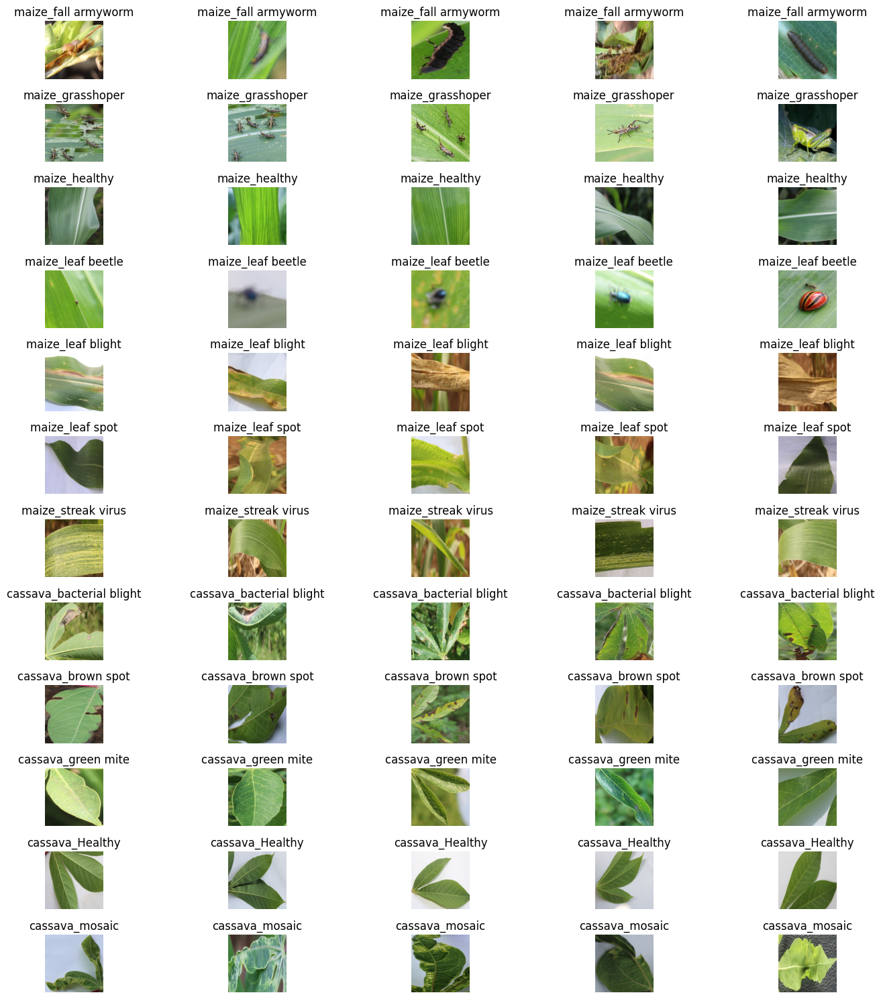

In [10]:
# Define base directories for both datasets
maize_base_dir = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Maize'
cassava_base_dir = '/content/drive/MyDrive/Raw Data/CCMT Dataset/Cassava'

# Folder names for Maize dataset
maize_folders = ['fall armyworm', 'grasshoper', 'healthy', 'leaf beetle', 'leaf blight', 'leaf spot', 'streak virus']

# Folder names for Cassava dataset
cassava_folders = ['bacterial blight', 'brown spot', 'green mite', 'Healthy', 'mosaic']

# Function to check if a file is a valid image
def is_valid_image(file_path):
    try:
        with Image.open(file_path) as img:
            img.verify()  # Verify if the file is a valid image
        return True
    except (IOError, SyntaxError) as e:
        return False

# Function to remove invalid image files
def remove_invalid_images(folder_path):
    files = os.listdir(folder_path)
    for file in files:
        file_path = os.path.join(folder_path, file)
        if not is_valid_image(file_path):
            print(f"Removing invalid file: {file}")
            os.remove(file_path)

# Remove invalid images before training for both datasets
for folder in maize_folders:
    remove_invalid_images(os.path.join(maize_base_dir, folder))
for folder in cassava_folders:
    remove_invalid_images(os.path.join(cassava_base_dir, folder))

# Create a DataFrame for the images in both datasets
image_paths = []
image_classes = []

# Maize dataset
for folder in maize_folders:
    folder_path = os.path.join(maize_base_dir, folder)
    for filename in os.listdir(folder_path):
        if filename.endswith(('.png', '.jpg', '.jpeg')):
            image_paths.append(os.path.join(folder_path, filename))
            image_classes.append(f"maize_{folder}")

# Cassava dataset
for folder in cassava_folders:
    folder_path = os.path.join(cassava_base_dir, folder)
    for filename in os.listdir(folder_path):
        if filename.endswith(('.png', '.jpg', '.jpeg')):
            image_paths.append(os.path.join(folder_path, filename))
            image_classes.append(f"cassava_{folder}")

# Create a DataFrame
df_images = pd.DataFrame({
    'image_path': image_paths,
    'class': image_classes
})

# Show the DataFrame with image paths and their classes
print(df_images.head())

# Set up a plot to display the images
num_images_per_class = 5  # Show 5 images per class
fig, axes = plt.subplots(nrows=len(maize_folders) + len(cassava_folders), ncols=num_images_per_class, figsize=(15, 15))

# Loop through each class and display 5 images
for i, folder in enumerate(maize_folders + cassava_folders):
    # Filter images of the current class
    class_images = df_images[df_images['class'].str.contains(folder)].head(num_images_per_class)

    for j, (image_path, label) in enumerate(zip(class_images['image_path'], class_images['class'])):
        img = Image.open(image_path)
        axes[i, j].imshow(img)
        axes[i, j].axis('off')
        axes[i, j].set_title(label)

plt.tight_layout()
plt.show()

### Printing number of unique classes

In [11]:
unique_classes = df_images['class'].nunique()
print(f"Number of classes in the dataset: {unique_classes}")

Number of classes in the dataset: 12


### Combining Maize and Cassava Dataframes and creating splits into train, test and validation (80%, 10%, 10%)

In [12]:
# Combine the Maize and Cassava DataFrames
df_combined = pd.concat([df_maize, df_cassava], ignore_index=True)

# Split into training (80%), testing (10%), and validation (10%)
train_df, test_df = train_test_split(df_combined, test_size=0.2, stratify=df_combined['class'], random_state=42)
valid_df, test_df = train_test_split(test_df, test_size=0.5, stratify=test_df['class'], random_state=42)

# Display the counts for each dataset to verify
print(f"Training set: {train_df.shape[0]} images")
print(f"Validation set: {valid_df.shape[0]} images")
print(f"Testing set: {test_df.shape[0]} images")

# Optional: Check the distribution of classes in each set
print("\nTraining set class distribution:")
print(train_df['class'].value_counts())

print("\nValidation set class distribution:")
print(valid_df['class'].value_counts())

print("\nTesting set class distribution:")
print(test_df['class'].value_counts())

Training set: 10648 images
Validation set: 1331 images
Testing set: 1332 images

Training set class distribution:
class
bacterial blight    2218
brown spot          1205
Healthy             1026
leaf spot            999
mosaic               988
green mite           923
streak virus         802
leaf blight          798
leaf beetle          750
grasshoper           546
fall armyworm        228
healthy              165
Name: count, dtype: int64

Validation set class distribution:
class
bacterial blight    277
brown spot          150
Healthy             128
leaf spot           125
mosaic              123
green mite          115
leaf blight         100
streak virus        100
leaf beetle          94
grasshoper           69
fall armyworm        29
healthy              21
Name: count, dtype: int64

Testing set class distribution:
class
bacterial blight    277
brown spot          151
Healthy             129
leaf spot           125
mosaic              124
green mite          116
leaf blight    

In [13]:
!pip install keras-tuner --quiet

### Image Data Generator to load and Augment Images in Batches

In [14]:
# Data generators to load and augment images in batches
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=20, width_shift_range=0.2,
                                   height_shift_range=0.2, shear_range=0.2, zoom_range=0.2,
                                   horizontal_flip=True, fill_mode='nearest')

valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)
# Train, valid and test generator
train_generator = train_datagen.flow_from_dataframe(dataframe=train_df, directory=None,
                                                    x_col='image_path', y_col='class',
                                                    target_size=(150, 150), batch_size=32,
                                                    class_mode='categorical')

valid_generator = valid_datagen.flow_from_dataframe(dataframe=valid_df, directory=None,
                                                    x_col='image_path', y_col='class',
                                                    target_size=(150, 150), batch_size=32,
                                                    class_mode='categorical')

test_generator = test_datagen.flow_from_dataframe(dataframe=test_df, directory=None,
                                                  x_col='image_path', y_col='class',
                                                  target_size=(150, 150), batch_size=32,
                                                  class_mode='categorical')

Found 10648 validated image filenames belonging to 12 classes.
Found 1331 validated image filenames belonging to 12 classes.
Found 1332 validated image filenames belonging to 12 classes.


# Building of Models

## CNN Models (Non pre trained)

## 10 Epochs

In [15]:
# Build the CNN Model
model= Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(len(train_df['class'].unique()), activation='softmax')  # Number of classes
])
# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Define a checkpoint to save the best model during training
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)

# Train the model
history = model.fit(train_generator, epochs=20, validation_data=valid_generator,
                    callbacks=[checkpoint])

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")



/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step - accuracy: 0.2096 - loss: 2.3050
Epoch 1: val_loss improved from inf to 1.94400, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 142s 420ms/step - accuracy: 0.2097 - loss: 2.3046 - val_accuracy: 0.3306 - val_loss: 1.9440
Epoch 2/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step - accuracy: 0.3334 - loss: 1.9410
Epoch 2: val_loss improved from 1.94400 to 1.62970, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 139s 417ms/step - accuracy: 0.3334 - loss: 1.9409 - val_accuracy: 0.4237 - val_loss: 1.6297
Epoch 3/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step - accuracy: 0.3942 - loss: 1.7528
Epoch 3: val_loss improved from 1.62970 to 1.44577, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 138s 415ms/step - accuracy: 0.3942 - loss: 1.7527 - val_accuracy: 0.4929 - val_loss: 1.4458
Epoch 4/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step - accuracy: 0.4449 - loss: 1.5829
Epoch 4: val_loss improved from 1.44577 to 1.26724, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 138s 415ms/step - accuracy: 0.4449 - loss: 1.5828 - val_accuracy: 0.5477 - val_loss: 1.2672
Epoch 5/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step - accuracy: 0.4968 - loss: 1.4328
Epoch 5: val_loss improved from 1.26724 to 1.13393, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 135s 404ms/step - accuracy: 0.4969 - loss: 1.4327 - val_accuracy: 0.6011 - val_loss: 1.1339
Epoch 6/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - accuracy: 0.5372 - loss: 1.3337
Epoch 6: val_loss did not improve from 1.13393
333/333 ━━━━━━━━━━━━━━━━━━━━ 138s 414ms/step - accuracy: 0.5372 - loss: 1.3337 - val_accuracy: 0.5958 - val_loss: 1.1802
Epoch 7/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step - accuracy: 0.5714 - loss: 1.2389
Epoch 7: val_loss improved from 1.13393 to 0.98354, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 137s 412ms/step - accuracy: 0.5714 - loss: 1.2388 - val_accuracy: 0.6627 - val_loss: 0.9835
Epoch 8/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step - accuracy: 0.5991 - loss: 1.1789
Epoch 8: val_loss improved from 0.98354 to 0.90298, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 133s 398ms/step - accuracy: 0.5991 - loss: 1.1788 - val_accuracy: 0.6950 - val_loss: 0.9030
Epoch 9/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step - accuracy: 0.6229 - loss: 1.1006
Epoch 9: val_loss improved from 0.90298 to 0.86599, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 132s 396ms/step - accuracy: 0.6229 - loss: 1.1006 - val_accuracy: 0.6965 - val_loss: 0.8660
Epoch 10/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - accuracy: 0.6212 - loss: 1.0755
Epoch 10: val_loss did not improve from 0.86599
333/333 ━━━━━━━━━━━━━━━━━━━━ 134s 403ms/step - accuracy: 0.6211 - loss: 1.0755 - val_accuracy: 0.6582 - val_loss: 0.9722
Epoch 11/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step - accuracy: 0.6350 - loss: 1.0468
Epoch 11: val_loss improved from 0.86599 to 0.81354, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 130s 391ms/step - accuracy: 0.6350 - loss: 1.0468 - val_accuracy: 0.7070 - val_loss: 0.8135
Epoch 12/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 372ms/step - accuracy: 0.6581 - loss: 0.9880
Epoch 12: val_loss did not improve from 0.81354
333/333 ━━━━━━━━━━━━━━━━━━━━ 134s 403ms/step - accuracy: 0.6581 - loss: 0.9880 - val_accuracy: 0.7077 - val_loss: 0.8506
Epoch 13/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step - accuracy: 0.6592 - loss: 0.9546
Epoch 13: val_loss improved from 0.81354 to 0.73804, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 132s 395ms/step - accuracy: 0.6593 - loss: 0.9546 - val_accuracy: 0.7310 - val_loss: 0.7380
Epoch 14/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 380ms/step - accuracy: 0.6825 - loss: 0.9218
Epoch 14: val_loss improved from 0.73804 to 0.73632, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 133s 401ms/step - accuracy: 0.6825 - loss: 0.9218 - val_accuracy: 0.7446 - val_loss: 0.7363
Epoch 15/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step - accuracy: 0.6809 - loss: 0.8939
Epoch 15: val_loss improved from 0.73632 to 0.70235, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 132s 395ms/step - accuracy: 0.6809 - loss: 0.8940 - val_accuracy: 0.7491 - val_loss: 0.7023
Epoch 16/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step - accuracy: 0.6983 - loss: 0.8673
Epoch 16: val_loss did not improve from 0.70235
333/333 ━━━━━━━━━━━━━━━━━━━━ 136s 406ms/step - accuracy: 0.6983 - loss: 0.8673 - val_accuracy: 0.6664 - val_loss: 0.9811
Epoch 17/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - accuracy: 0.7127 - loss: 0.8431
Epoch 17: val_loss improved from 0.70235 to 0.69861, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 135s 404ms/step - accuracy: 0.7126 - loss: 0.8431 - val_accuracy: 0.7476 - val_loss: 0.6986
Epoch 18/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step - accuracy: 0.7131 - loss: 0.8430
Epoch 18: val_loss did not improve from 0.69861
333/333 ━━━━━━━━━━━━━━━━━━━━ 134s 403ms/step - accuracy: 0.7131 - loss: 0.8429 - val_accuracy: 0.7581 - val_loss: 0.7462
Epoch 19/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step - accuracy: 0.7152 - loss: 0.8042
Epoch 19: val_loss did not improve from 0.69861
333/333 ━━━━━━━━━━━━━━━━━━━━ 138s 413ms/step - accuracy: 0.7152 - loss: 0.8042 - val_accuracy: 0.7566 - val_loss: 0.7054
Epoch 20/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step - accuracy: 0.7144 - loss: 0.8232
Epoch 20: val_loss improved from 0.69861 to 0.63068, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 139s 416ms/step - accuracy: 0.7144 - loss: 0.8231 - val_accuracy: 0.7904 - val_loss: 0.6307
42/42 ━━━━━━━━━━━━━━━━━━━━ 7s 167ms/step - accuracy: 0.7703 - loss: 0.6499
Test accuracy: 0.7808


## training and validation on Cnn on 10 epoch

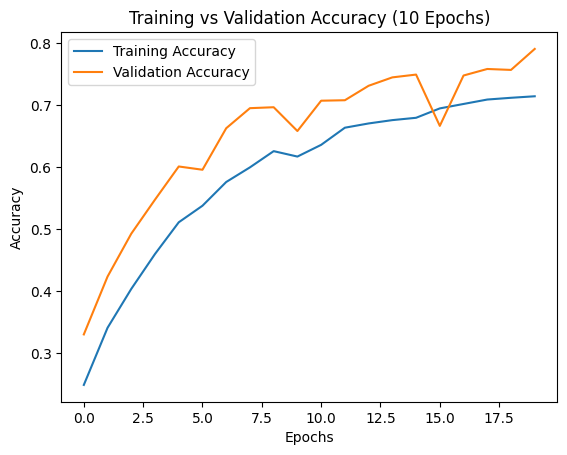

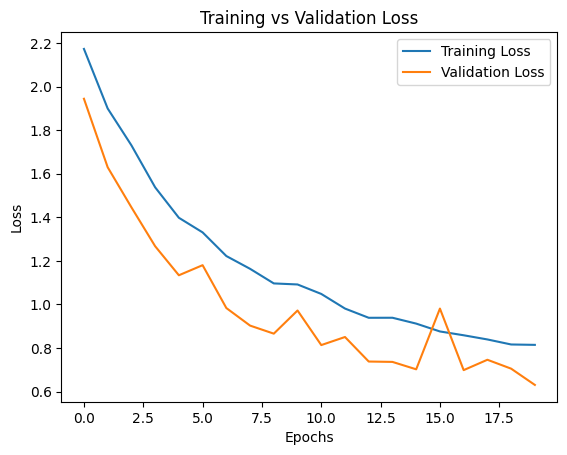

In [16]:
# Plot the training and validation accuracy fo 10 Epochs
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training vs Validation Accuracy (10 Epochs)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Evaluation on cnn model on 10 epoch


42/42 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step
Classification Report:
                  precision    recall  f1-score   support

         Healthy       0.09      0.09      0.09       129
bacterial blight       0.20      0.21      0.21       277
      brown spot       0.12      0.13      0.12       151
   fall armyworm       0.00      0.00      0.00        28
      grasshoper       0.03      0.03      0.03        68
      green mite       0.03      0.03      0.03       116
         healthy       0.00      0.00      0.00        20
     leaf beetle       0.09      0.09      0.09        94
     leaf blight       0.03      0.03      0.03       100
       leaf spot       0.09      0.12      0.10       125
          mosaic       0.12      0.10      0.11       124
    streak virus       0.06      0.06      0.06       100

        accuracy                           0.11      1332
       macro avg       0.07      0.07      0.07      1332
    weighted avg       0.10      0.11      0.10      1332



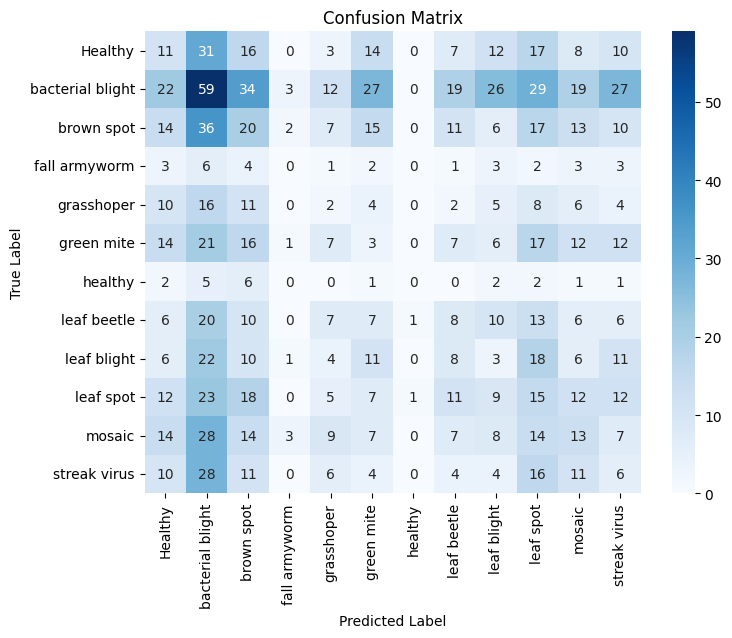

In [17]:
# Get the true labels
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())  # Class labels

# Predict on the test set
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Generate classification report
print("Classification Report:")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# Generate confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

## CNN FOR 20 EPOCHS

In [18]:
# Train the model
history1 = model.fit(train_generator, epochs=20, validation_data=valid_generator,
                    callbacks=[checkpoint])

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

Epoch 1/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step - accuracy: 0.7269 - loss: 0.7612
Epoch 1: val_loss did not improve from 0.63068
333/333 ━━━━━━━━━━━━━━━━━━━━ 137s 410ms/step - accuracy: 0.7269 - loss: 0.7612 - val_accuracy: 0.7678 - val_loss: 0.6920
Epoch 2/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step - accuracy: 0.7217 - loss: 0.7809
Epoch 2: val_loss did not improve from 0.63068
333/333 ━━━━━━━━━━━━━━━━━━━━ 136s 407ms/step - accuracy: 0.7217 - loss: 0.7809 - val_accuracy: 0.7724 - val_loss: 0.6725
Epoch 3/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step - accuracy: 0.7418 - loss: 0.7311
Epoch 3: val_loss did not improve from 0.63068
333/333 ━━━━━━━━━━━━━━━━━━━━ 137s 410ms/step - accuracy: 0.7418 - loss: 0.7312 - val_accuracy: 0.7806 - val_loss: 0.6337
Epoch 4/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step - accuracy: 0.7342 - loss: 0.7429
Epoch 4: val_loss did not improve from 0.63068
333/333 ━━━━━━━━━━━━━━━━━━━━ 138s 414ms/step - accuracy: 0.7341 - loss: 0.7430 - val_accuracy: 0.

333/333 ━━━━━━━━━━━━━━━━━━━━ 135s 405ms/step - accuracy: 0.7421 - loss: 0.7271 - val_accuracy: 0.7926 - val_loss: 0.5932
Epoch 7/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step - accuracy: 0.7581 - loss: 0.6826
Epoch 7: val_loss did not improve from 0.59317
333/333 ━━━━━━━━━━━━━━━━━━━━ 137s 412ms/step - accuracy: 0.7581 - loss: 0.6827 - val_accuracy: 0.7814 - val_loss: 0.6694
Epoch 8/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step - accuracy: 0.7444 - loss: 0.7081
Epoch 8: val_loss did not improve from 0.59317
333/333 ━━━━━━━━━━━━━━━━━━━━ 135s 405ms/step - accuracy: 0.7444 - loss: 0.7081 - val_accuracy: 0.7904 - val_loss: 0.6628
Epoch 9/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step - accuracy: 0.7547 - loss: 0.6866
Epoch 9: val_loss improved from 0.59317 to 0.54678, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 140s 420ms/step - accuracy: 0.7547 - loss: 0.6867 - val_accuracy: 0.8137 - val_loss: 0.5468
Epoch 10/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step - accuracy: 0.7515 - loss: 0.6916
Epoch 10: val_loss improved from 0.54678 to 0.53256, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 139s 416ms/step - accuracy: 0.7515 - loss: 0.6917 - val_accuracy: 0.8122 - val_loss: 0.5326
Epoch 11/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step - accuracy: 0.7577 - loss: 0.6815
Epoch 11: val_loss did not improve from 0.53256
333/333 ━━━━━━━━━━━━━━━━━━━━ 137s 412ms/step - accuracy: 0.7577 - loss: 0.6816 - val_accuracy: 0.8009 - val_loss: 0.5815
Epoch 12/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step - accuracy: 0.7641 - loss: 0.6744
Epoch 12: val_loss did not improve from 0.53256
333/333 ━━━━━━━━━━━━━━━━━━━━ 136s 407ms/step - accuracy: 0.7641 - loss: 0.6744 - val_accuracy: 0.7881 - val_loss: 0.5722
Epoch 13/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 392ms/step - accuracy: 0.7633 - loss: 0.6571
Epoch 13: val_loss did not improve from 0.53256
333/333 ━━━━━━━━━━━━━━━━━━━━ 138s 413ms/step - accuracy: 0.7633 - loss: 0.6571 - val_accuracy: 0.8002 - val_loss: 0.5606
Epoch 14/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step - accuracy: 0.7631 - loss: 0.6642
Epoch 14: val_lo

333/333 ━━━━━━━━━━━━━━━━━━━━ 136s 409ms/step - accuracy: 0.7870 - loss: 0.6169 - val_accuracy: 0.8197 - val_loss: 0.5192
Epoch 17/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step - accuracy: 0.7756 - loss: 0.6234
Epoch 17: val_loss did not improve from 0.51917
333/333 ━━━━━━━━━━━━━━━━━━━━ 137s 410ms/step - accuracy: 0.7756 - loss: 0.6234 - val_accuracy: 0.8069 - val_loss: 0.5566
Epoch 18/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step - accuracy: 0.7767 - loss: 0.6324
Epoch 18: val_loss did not improve from 0.51917
333/333 ━━━━━━━━━━━━━━━━━━━━ 136s 408ms/step - accuracy: 0.7767 - loss: 0.6324 - val_accuracy: 0.8024 - val_loss: 0.5373
Epoch 19/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step - accuracy: 0.7765 - loss: 0.6273
Epoch 19: val_loss did not improve from 0.51917
333/333 ━━━━━━━━━━━━━━━━━━━━ 137s 410ms/step - accuracy: 0.7765 - loss: 0.6273 - val_accuracy: 0.7776 - val_loss: 0.6685
Epoch 20/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step - accuracy: 0.7745 - loss: 0.6267
Epoch 20: val_lo

## training and validation accuracy and loss of cnn on 20 epoch

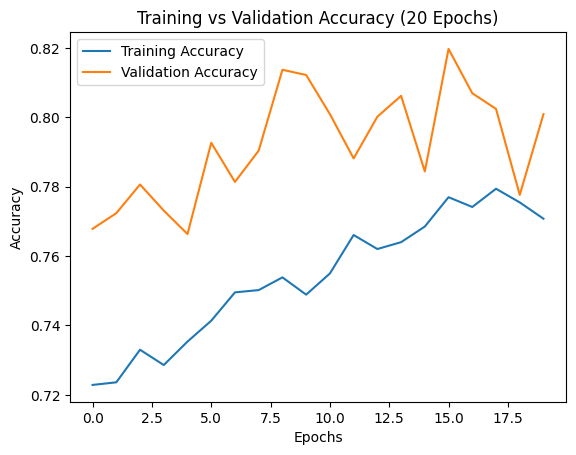

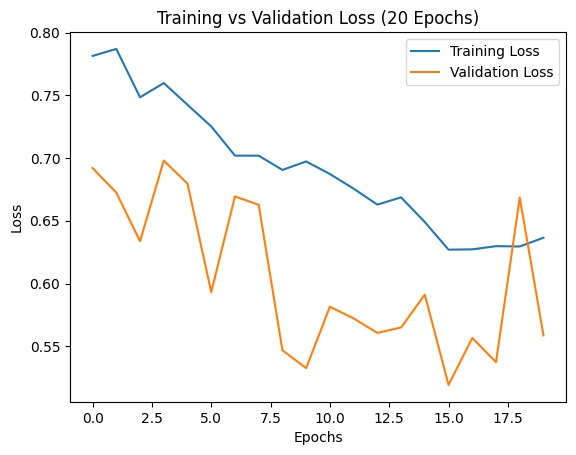

In [19]:
# Plot the training and validation accuracy for 20 epochs
plt.plot(history1.history['accuracy'], label='Training Accuracy')
plt.plot(history1.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training vs Validation Accuracy (20 Epochs)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.plot(history1.history['loss'], label='Training Loss')
plt.plot(history1.history['val_loss'], label='Validation Loss')
plt.title('Training vs Validation Loss (20 Epochs)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

 ## evaluation of cnn model on 20 epoch

42/42 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step
Classification Report:
                  precision    recall  f1-score   support

         Healthy       0.08      0.09      0.08       129
bacterial blight       0.23      0.24      0.23       277
      brown spot       0.11      0.10      0.11       151
   fall armyworm       0.00      0.00      0.00        28
      grasshoper       0.07      0.07      0.07        68
      green mite       0.07      0.08      0.07       116
         healthy       0.00      0.00      0.00        20
     leaf beetle       0.09      0.10      0.10        94
     leaf blight       0.10      0.07      0.08       100
       leaf spot       0.10      0.11      0.10       125
          mosaic       0.12      0.12      0.12       124
    streak virus       0.09      0.10      0.09       100

        accuracy                           0.12      1332
       macro avg       0.09      0.09      0.09      1332
    weighted avg       0.12      0.12      0.12      1332



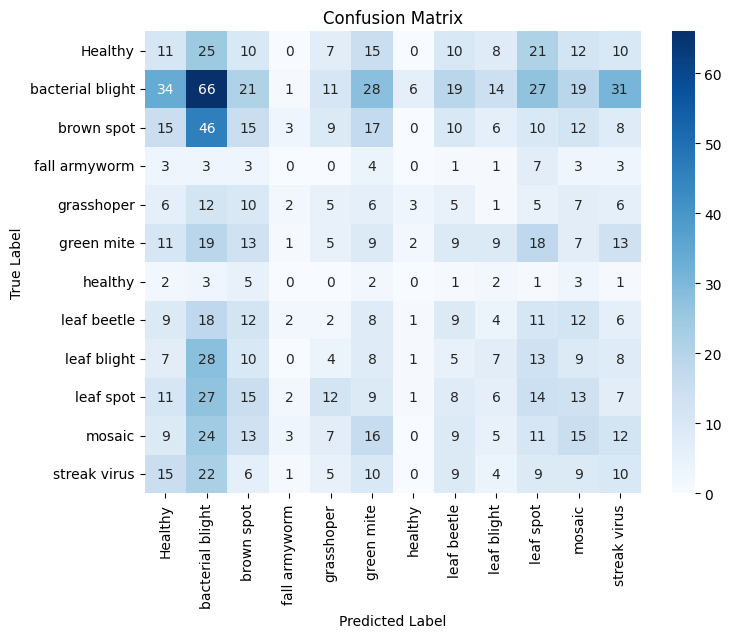

In [20]:
# Get the true labels
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())  # Class labels

# Predict on the test set
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Generate classification report
print("Classification Report:")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# Generate confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

## CNN model on 30 epoch

In [21]:
# Train the model
history2 = model.fit(train_generator, epochs=30, validation_data=valid_generator,
                    callbacks=[checkpoint])

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

Epoch 1/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 387ms/step - accuracy: 0.7794 - loss: 0.6145
Epoch 1: val_loss improved from 0.51917 to 0.51520, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 140s 419ms/step - accuracy: 0.7794 - loss: 0.6145 - val_accuracy: 0.8264 - val_loss: 0.5152
Epoch 2/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step - accuracy: 0.7721 - loss: 0.6365
Epoch 2: val_loss improved from 0.51520 to 0.48601, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 137s 411ms/step - accuracy: 0.7721 - loss: 0.6365 - val_accuracy: 0.8340 - val_loss: 0.4860
Epoch 3/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step - accuracy: 0.7855 - loss: 0.5829
Epoch 3: val_loss improved from 0.48601 to 0.47816, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 138s 414ms/step - accuracy: 0.7855 - loss: 0.5830 - val_accuracy: 0.8347 - val_loss: 0.4782
Epoch 4/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - accuracy: 0.7894 - loss: 0.5686
Epoch 4: val_loss did not improve from 0.47816
333/333 ━━━━━━━━━━━━━━━━━━━━ 131s 392ms/step - accuracy: 0.7894 - loss: 0.5686 - val_accuracy: 0.8144 - val_loss: 0.5322
Epoch 5/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - accuracy: 0.7935 - loss: 0.5930
Epoch 5: val_loss did not improve from 0.47816
333/333 ━━━━━━━━━━━━━━━━━━━━ 131s 392ms/step - accuracy: 0.7935 - loss: 0.5930 - val_accuracy: 0.8234 - val_loss: 0.5013
Epoch 6/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step - accuracy: 0.7980 - loss: 0.5815
Epoch 6: val_loss did not improve from 0.47816
333/333 ━━━━━━━━━━━━━━━━━━━━ 138s 415ms/step - accuracy: 0.7979 - loss: 0.5816 - val_accuracy: 0.8167 - val_loss: 0.5135
Epoch 7/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step - accuracy: 0.7966 - loss: 0.5679
Epoch 7: val_loss did n

333/333 ━━━━━━━━━━━━━━━━━━━━ 142s 427ms/step - accuracy: 0.8015 - loss: 0.5359 - val_accuracy: 0.8505 - val_loss: 0.4553
Epoch 15/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step - accuracy: 0.8059 - loss: 0.5477
Epoch 15: val_loss did not improve from 0.45528
333/333 ━━━━━━━━━━━━━━━━━━━━ 142s 426ms/step - accuracy: 0.8059 - loss: 0.5477 - val_accuracy: 0.8302 - val_loss: 0.5046
Epoch 16/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step - accuracy: 0.8054 - loss: 0.5283
Epoch 16: val_loss did not improve from 0.45528
333/333 ━━━━━━━━━━━━━━━━━━━━ 142s 426ms/step - accuracy: 0.8053 - loss: 0.5284 - val_accuracy: 0.7971 - val_loss: 0.5386
Epoch 17/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step - accuracy: 0.8068 - loss: 0.5305
Epoch 17: val_loss improved from 0.45528 to 0.44864, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 144s 431ms/step - accuracy: 0.8069 - loss: 0.5305 - val_accuracy: 0.8460 - val_loss: 0.4486
Epoch 18/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step - accuracy: 0.8173 - loss: 0.5132
Epoch 18: val_loss did not improve from 0.44864
333/333 ━━━━━━━━━━━━━━━━━━━━ 144s 431ms/step - accuracy: 0.8173 - loss: 0.5132 - val_accuracy: 0.8332 - val_loss: 0.4900
Epoch 19/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step - accuracy: 0.8030 - loss: 0.5562
Epoch 19: val_loss improved from 0.44864 to 0.44119, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 141s 424ms/step - accuracy: 0.8030 - loss: 0.5562 - val_accuracy: 0.8392 - val_loss: 0.4412
Epoch 20/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step - accuracy: 0.8094 - loss: 0.5155
Epoch 20: val_loss did not improve from 0.44119
333/333 ━━━━━━━━━━━━━━━━━━━━ 141s 424ms/step - accuracy: 0.8094 - loss: 0.5155 - val_accuracy: 0.8317 - val_loss: 0.4528
Epoch 21/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step - accuracy: 0.8108 - loss: 0.5149
Epoch 21: val_loss did not improve from 0.44119
333/333 ━━━━━━━━━━━━━━━━━━━━ 140s 419ms/step - accuracy: 0.8108 - loss: 0.5149 - val_accuracy: 0.8460 - val_loss: 0.4533
Epoch 22/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step - accuracy: 0.8296 - loss: 0.4915
Epoch 22: val_loss did not improve from 0.44119
333/333 ━━━━━━━━━━━━━━━━━━━━ 141s 424ms/step - accuracy: 0.8296 - loss: 0.4915 - val_accuracy: 0.8400 - val_loss: 0.4554
Epoch 23/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step - accuracy: 0.8086 - loss: 0.5370
Epoch 23: val_lo

333/333 ━━━━━━━━━━━━━━━━━━━━ 144s 432ms/step - accuracy: 0.8241 - loss: 0.5042 - val_accuracy: 0.8445 - val_loss: 0.4355
Epoch 30/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step - accuracy: 0.8171 - loss: 0.5031
Epoch 30: val_loss improved from 0.43545 to 0.40723, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 143s 428ms/step - accuracy: 0.8171 - loss: 0.5031 - val_accuracy: 0.8655 - val_loss: 0.4072
42/42 ━━━━━━━━━━━━━━━━━━━━ 7s 175ms/step - accuracy: 0.8437 - loss: 0.4511
Test accuracy: 0.8468


## training and validation accuracy and loss of cnn on 30 epoch

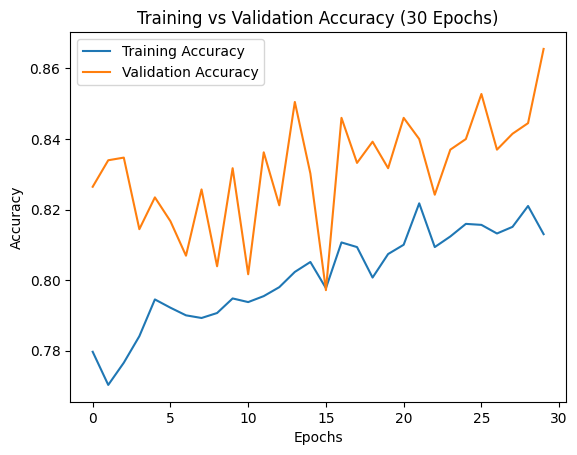

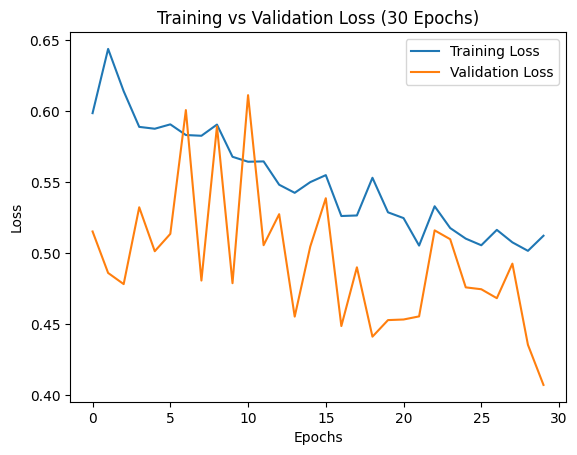

In [22]:
# Plot the training and validation accuracy for 30 epochs
plt.plot(history2.history['accuracy'], label='Training Accuracy')
plt.plot(history2.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training vs Validation Accuracy (30 Epochs)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss for 30 epochs
plt.plot(history2.history['loss'], label='Training Loss')
plt.plot(history2.history['val_loss'], label='Validation Loss')
plt.title('Training vs Validation Loss (30 Epochs)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## evaluation of cnn model on 30 epoch

42/42 ━━━━━━━━━━━━━━━━━━━━ 7s 168ms/step
Classification Report:
                  precision    recall  f1-score   support

         Healthy       0.11      0.10      0.10       129
bacterial blight       0.25      0.24      0.24       277
      brown spot       0.11      0.12      0.11       151
   fall armyworm       0.04      0.04      0.04        28
      grasshoper       0.04      0.04      0.04        68
      green mite       0.07      0.07      0.07       116
         healthy       0.00      0.00      0.00        20
     leaf beetle       0.01      0.01      0.01        94
     leaf blight       0.07      0.07      0.07       100
       leaf spot       0.09      0.10      0.09       125
          mosaic       0.08      0.08      0.08       124
    streak virus       0.04      0.04      0.04       100

        accuracy                           0.11      1332
       macro avg       0.08      0.08      0.08      1332
    weighted avg       0.11      0.11      0.11      1332



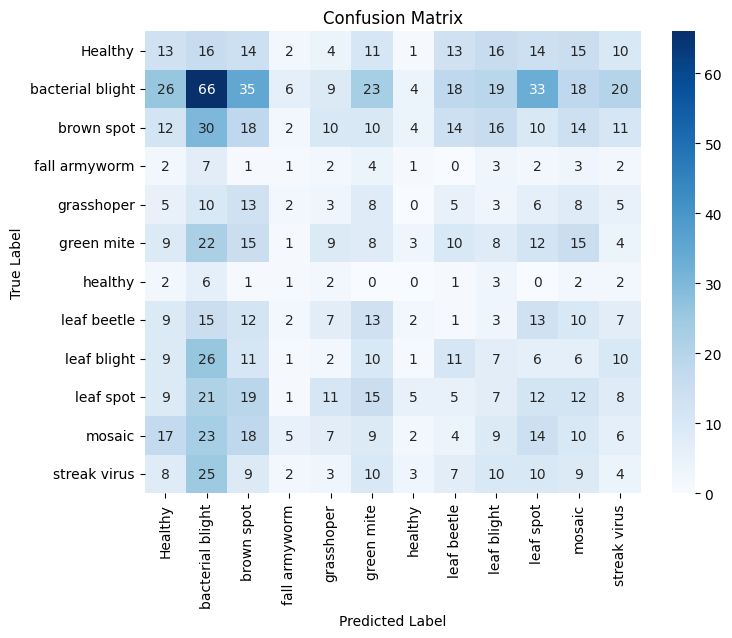

In [23]:
# Get the true labels
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())  # Class labels

# Predict on the test set
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Generate classification report
print("Classification Report:")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# Generate confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

## Algorithm comparison for 3 CNN Epoch models

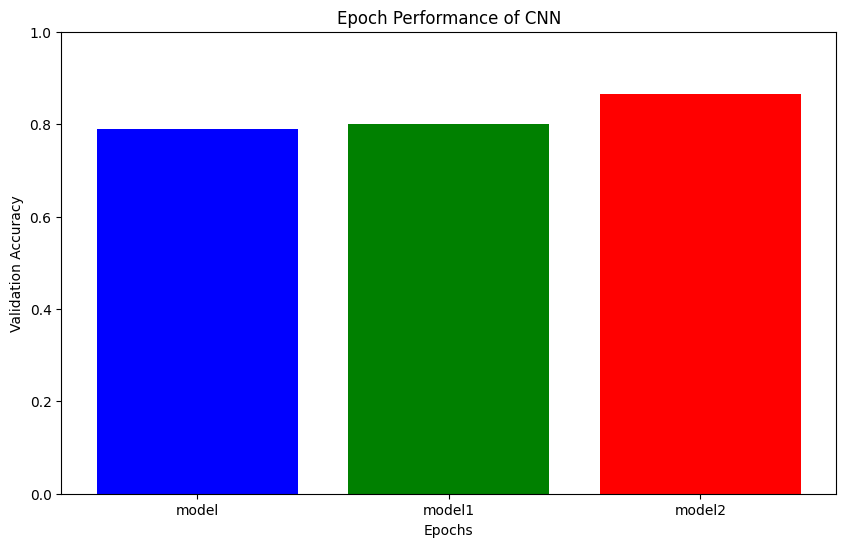

In [24]:
# Code to compare the cnn epoch performance of 10, 20, 30
accuracy_scores = [
    history.history['val_accuracy'][-1],  # Accuracy after 10 epochs
    history1.history['val_accuracy'][-1], # Accuracy after 20 epochs
    history2.history['val_accuracy'][-1]  # Accuracy after 30 epochs
]

algorithms = ['model', 'model1', 'model2']

plt.figure(figsize=(10, 6))
plt.bar(algorithms, accuracy_scores, color=['blue', 'green', 'red'])
plt.xlabel('Epochs')
plt.ylabel('Validation Accuracy')
plt.title('Epoch Performance of CNN')
plt.ylim([0, 1])
plt.show()

# VGG16 on 10 epochs using early stopping techniques


In [26]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Load pre-trained VGG16 model without the top layer for transfer learning
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Freeze the base model layers
base_model.trainable = False
# Freeze the base model layers
base_model.trainable = False

# Build the model by adding custom layers on top of VGG16
VGG16_model1 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(train_df['class'].unique()), activation='softmax')  # Number of classes
])

# Compile the model
VGG16_model1.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Define callbacks
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)

# Train the model
VGG16_history1 = VGG16_model1.fit(train_generator, epochs=10, validation_data=valid_generator,
                    callbacks=[checkpoint, early_stopping])

# Evaluate the model on the test set
test_loss, test_accuracy = VGG16_model1.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
Epoch 1/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3769 - loss: 1.8446
Epoch 1: val_loss improved from inf to 1.04954, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 535s 2s/step - accuracy: 0.3773 - loss: 1.8437 - val_accuracy: 0.6536 - val_loss: 1.0495
Epoch 2/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6004 - loss: 1.1623
Epoch 2: val_loss improved from 1.04954 to 0.93288, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 531s 2s/step - accuracy: 0.6004 - loss: 1.1623 - val_accuracy: 0.6762 - val_loss: 0.9329
Epoch 3/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6272 - loss: 1.0527
Epoch 3: val_loss improved from 0.93288 to 0.84978, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 532s 2s/step - accuracy: 0.6273 - loss: 1.0527 - val_accuracy: 0.6972 - val_loss: 0.8498
Epoch 4/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6568 - loss: 0.9617
Epoch 4: val_loss improved from 0.84978 to 0.81053, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 536s 2s/step - accuracy: 0.6568 - loss: 0.9617 - val_accuracy: 0.7040 - val_loss: 0.8105
Epoch 5/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6593 - loss: 0.9463
Epoch 5: val_loss improved from 0.81053 to 0.75462, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 533s 2s/step - accuracy: 0.6593 - loss: 0.9462 - val_accuracy: 0.7220 - val_loss: 0.7546
Epoch 6/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6645 - loss: 0.9180
Epoch 6: val_loss did not improve from 0.75462
333/333 ━━━━━━━━━━━━━━━━━━━━ 535s 2s/step - accuracy: 0.6645 - loss: 0.9180 - val_accuracy: 0.7205 - val_loss: 0.7821
Epoch 7/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6827 - loss: 0.8738
Epoch 7: val_loss improved from 0.75462 to 0.71393, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 536s 2s/step - accuracy: 0.6827 - loss: 0.8737 - val_accuracy: 0.7453 - val_loss: 0.7139
Epoch 8/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6878 - loss: 0.8472
Epoch 8: val_loss improved from 0.71393 to 0.70242, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 536s 2s/step - accuracy: 0.6878 - loss: 0.8473 - val_accuracy: 0.7431 - val_loss: 0.7024
Epoch 9/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6960 - loss: 0.8495
Epoch 9: val_loss improved from 0.70242 to 0.69775, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 537s 2s/step - accuracy: 0.6960 - loss: 0.8495 - val_accuracy: 0.7431 - val_loss: 0.6978
Epoch 10/10
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6900 - loss: 0.8353
Epoch 10: val_loss improved from 0.69775 to 0.66426, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 538s 2s/step - accuracy: 0.6900 - loss: 0.8353 - val_accuracy: 0.7558 - val_loss: 0.6643
Restoring model weights from the end of the best epoch: 10.
42/42 ━━━━━━━━━━━━━━━━━━━━ 60s 1s/step - accuracy: 0.7421 - loss: 0.6660
Test accuracy: 0.7410


## Training and Validation Accuracy and Loss 10 Epochs

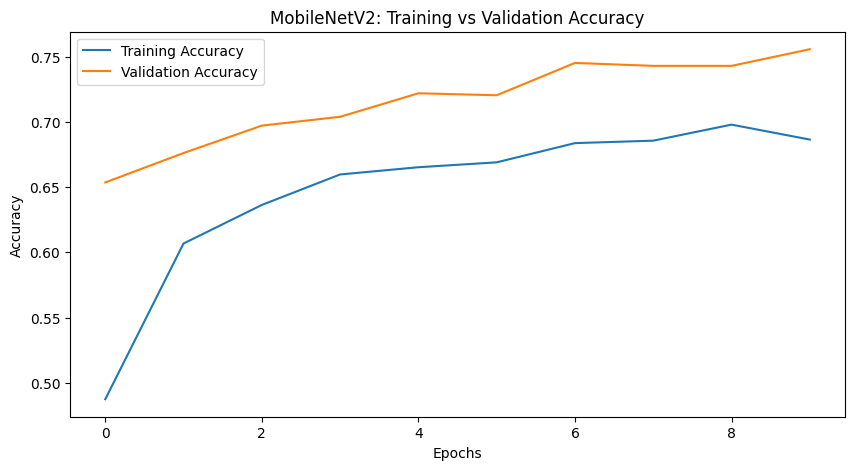

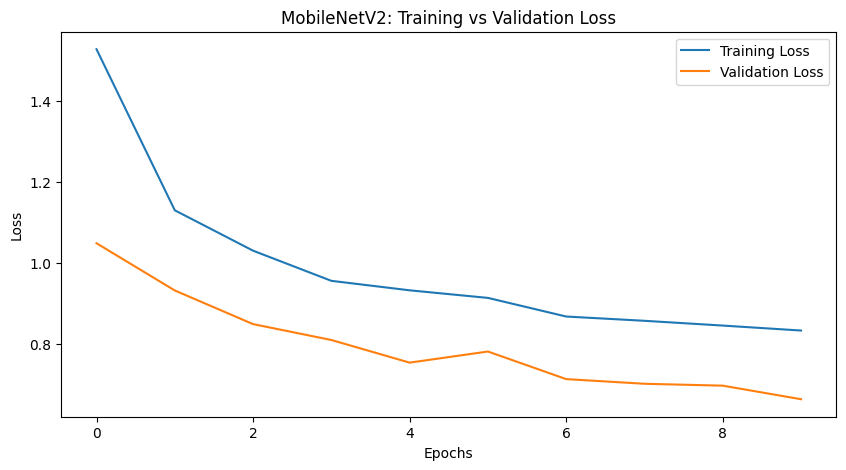

In [27]:
# Plot the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(VGG16_history1.history['accuracy'], label='Training Accuracy')
plt.plot(VGG16_history1.history['val_accuracy'], label='Validation Accuracy')
plt.title('MobileNetV2: Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(VGG16_history1.history['loss'], label='Training Loss')
plt.plot(VGG16_history1.history['val_loss'], label='Validation Loss')
plt.title('MobileNetV2: Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Model evaluation for 10 epochs VGG16

42/42 ━━━━━━━━━━━━━━━━━━━━ 61s 1s/step
Classification Report:
                  precision    recall  f1-score   support

         Healthy       0.08      0.08      0.08       129
bacterial blight       0.21      0.22      0.21       277
      brown spot       0.10      0.12      0.11       151
   fall armyworm       0.00      0.00      0.00        28
      grasshoper       0.03      0.03      0.03        68
      green mite       0.06      0.07      0.06       116
         healthy       0.00      0.00      0.00        20
     leaf beetle       0.11      0.11      0.11        94
     leaf blight       0.11      0.13      0.12       100
       leaf spot       0.08      0.06      0.07       125
          mosaic       0.08      0.06      0.07       124
    streak virus       0.07      0.07      0.07       100

        accuracy                           0.11      1332
       macro avg       0.08      0.08      0.08      1332
    weighted avg       0.11      0.11      0.11      1332



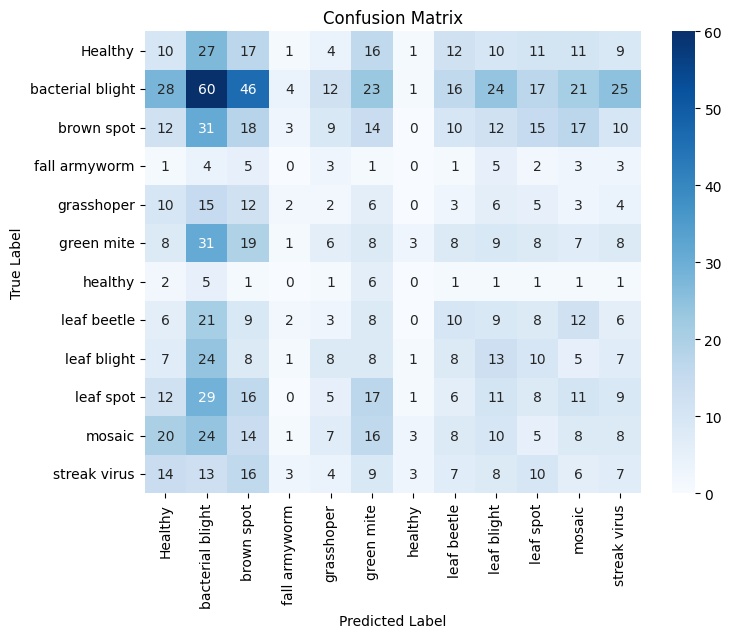

In [28]:
# Get the true labels
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())  # Class labels

# Predict on the test set
predictions = VGG16_model1.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Generate classification report
print("Classification Report:")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# Generate confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

## VGG16 on 20 epochs using early stopping techniques

In [29]:
# Load pre-trained VGG16 model without the top layer for transfer learning
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Freeze the base model layers
base_model.trainable = False
# Freeze the base model layers
base_model.trainable = False

# Build the model by adding custom layers on top of VGG16
VGG16_model2 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(train_df['class'].unique()), activation='softmax')  # Number of classes
])

# Compile the model
VGG16_model2.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Define callbacks
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)

# Train the model
VGG16_history2 = VGG16_model2.fit(train_generator, epochs=20, validation_data=valid_generator,
                    callbacks=[checkpoint, early_stopping])

# Evaluate the model on the test set
test_loss, test_accuracy = VGG16_model2.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

Epoch 1/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3760 - loss: 1.8326
Epoch 1: val_loss improved from inf to 1.09747, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 567s 2s/step - accuracy: 0.3764 - loss: 1.8316 - val_accuracy: 0.6341 - val_loss: 1.0975
Epoch 2/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6020 - loss: 1.1539
Epoch 2: val_loss improved from 1.09747 to 0.92884, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 537s 2s/step - accuracy: 0.6020 - loss: 1.1538 - val_accuracy: 0.6844 - val_loss: 0.9288
Epoch 3/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6243 - loss: 1.0631
Epoch 3: val_loss improved from 0.92884 to 0.82390, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 536s 2s/step - accuracy: 0.6244 - loss: 1.0630 - val_accuracy: 0.7070 - val_loss: 0.8239
Epoch 4/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6503 - loss: 0.9843
Epoch 4: val_loss improved from 0.82390 to 0.77365, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 561s 2s/step - accuracy: 0.6502 - loss: 0.9843 - val_accuracy: 0.7265 - val_loss: 0.7737
Epoch 5/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6703 - loss: 0.9314
Epoch 5: val_loss did not improve from 0.77365
333/333 ━━━━━━━━━━━━━━━━━━━━ 534s 2s/step - accuracy: 0.6703 - loss: 0.9314 - val_accuracy: 0.7107 - val_loss: 0.7816
Epoch 6/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6805 - loss: 0.9046
Epoch 6: val_loss improved from 0.77365 to 0.76312, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 536s 2s/step - accuracy: 0.6804 - loss: 0.9046 - val_accuracy: 0.7115 - val_loss: 0.7631
Epoch 7/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6776 - loss: 0.8858
Epoch 7: val_loss improved from 0.76312 to 0.71923, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 538s 2s/step - accuracy: 0.6776 - loss: 0.8858 - val_accuracy: 0.7393 - val_loss: 0.7192
Epoch 8/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6891 - loss: 0.8555
Epoch 8: val_loss improved from 0.71923 to 0.70672, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 540s 2s/step - accuracy: 0.6890 - loss: 0.8556 - val_accuracy: 0.7400 - val_loss: 0.7067
Epoch 9/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6860 - loss: 0.8531
Epoch 9: val_loss improved from 0.70672 to 0.67598, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 540s 2s/step - accuracy: 0.6860 - loss: 0.8531 - val_accuracy: 0.7513 - val_loss: 0.6760
Epoch 10/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6853 - loss: 0.8320
Epoch 10: val_loss did not improve from 0.67598
333/333 ━━━━━━━━━━━━━━━━━━━━ 540s 2s/step - accuracy: 0.6853 - loss: 0.8320 - val_accuracy: 0.7348 - val_loss: 0.7114
Epoch 11/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6962 - loss: 0.8126
Epoch 11: val_loss did not improve from 0.67598
333/333 ━━━━━━━━━━━━━━━━━━━━ 560s 2s/step - accuracy: 0.6962 - loss: 0.8126 - val_accuracy: 0.7491 - val_loss: 0.7052
Epoch 12/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6970 - loss: 0.8149
Epoch 12: val_loss did not improve from 0.67598
333/333 ━━━━━━━━━━━━━━━━━━━━ 542s 2s/step - accuracy: 0.6970 - loss: 0.8149 - val_accuracy: 0.7363 - val_loss: 0.7125
Epoch 13/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7098 - loss: 0.7934
Epoch 13: val_loss improved from 0.67598

333/333 ━━━━━━━━━━━━━━━━━━━━ 544s 2s/step - accuracy: 0.7098 - loss: 0.7934 - val_accuracy: 0.7528 - val_loss: 0.6615
Epoch 14/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7015 - loss: 0.8080
Epoch 14: val_loss did not improve from 0.66145
333/333 ━━━━━━━━━━━━━━━━━━━━ 540s 2s/step - accuracy: 0.7015 - loss: 0.8080 - val_accuracy: 0.7543 - val_loss: 0.6668
Epoch 15/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7106 - loss: 0.7882
Epoch 15: val_loss improved from 0.66145 to 0.62772, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 538s 2s/step - accuracy: 0.7107 - loss: 0.7882 - val_accuracy: 0.7678 - val_loss: 0.6277
Epoch 16/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7156 - loss: 0.7708
Epoch 16: val_loss did not improve from 0.62772
333/333 ━━━━━━━━━━━━━━━━━━━━ 566s 2s/step - accuracy: 0.7156 - loss: 0.7708 - val_accuracy: 0.7476 - val_loss: 0.6745
Epoch 17/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7238 - loss: 0.7553
Epoch 17: val_loss did not improve from 0.62772
333/333 ━━━━━━━━━━━━━━━━━━━━ 541s 2s/step - accuracy: 0.7238 - loss: 0.7553 - val_accuracy: 0.7626 - val_loss: 0.6281
Epoch 18/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7138 - loss: 0.7753
Epoch 18: val_loss did not improve from 0.62772
333/333 ━━━━━━━━━━━━━━━━━━━━ 539s 2s/step - accuracy: 0.7138 - loss: 0.7753 - val_accuracy: 0.7566 - val_loss: 0.6513
Epoch 19/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7243 - loss: 0.7500
Epoch 19: val_loss improved from 0.62772

333/333 ━━━━━━━━━━━━━━━━━━━━ 535s 2s/step - accuracy: 0.7243 - loss: 0.7500 - val_accuracy: 0.7731 - val_loss: 0.6195
Epoch 20/20
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7224 - loss: 0.7582
Epoch 20: val_loss did not improve from 0.61949
333/333 ━━━━━━━━━━━━━━━━━━━━ 536s 2s/step - accuracy: 0.7224 - loss: 0.7582 - val_accuracy: 0.7626 - val_loss: 0.6529
Restoring model weights from the end of the best epoch: 19.
42/42 ━━━━━━━━━━━━━━━━━━━━ 59s 1s/step - accuracy: 0.7560 - loss: 0.6265
Test accuracy: 0.7560


## Training and validation accuracy and loss on 20 epochs

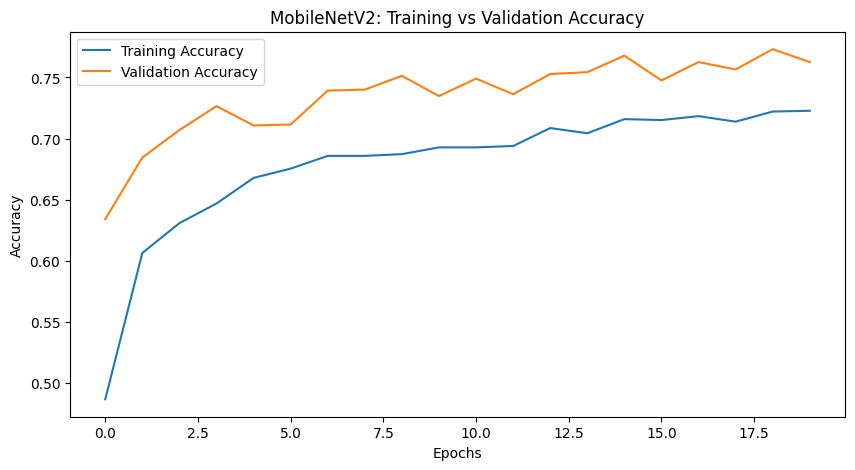

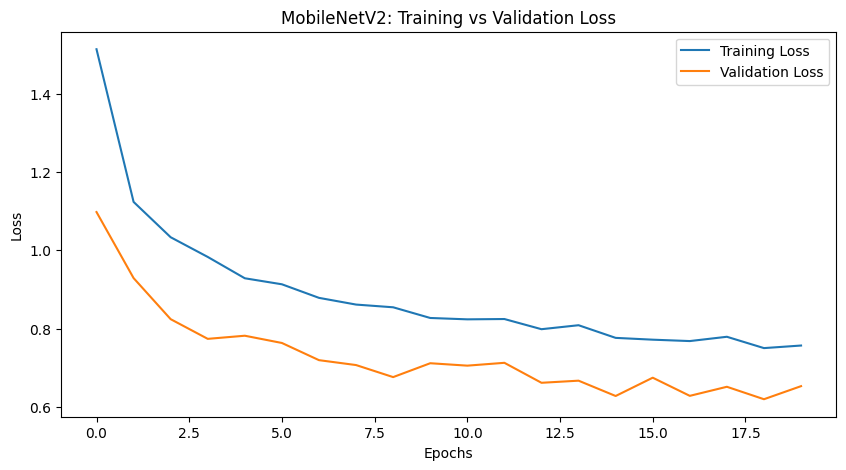

In [30]:
# Plot the training and validation accuracy
plt.figure(figsize=(10, 5))
plt.plot(VGG16_history2.history['accuracy'], label='Training Accuracy')
plt.plot(VGG16_history2.history['val_accuracy'], label='Validation Accuracy')
plt.title('MobileNetV2: Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(VGG16_history2.history['loss'], label='Training Loss')
plt.plot(VGG16_history2.history['val_loss'], label='Validation Loss')
plt.title('MobileNetV2: Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

##  Model evaluation VGG16 on 20 epochs

42/42 ━━━━━━━━━━━━━━━━━━━━ 59s 1s/step
Classification Report:
                  precision    recall  f1-score   support

         Healthy       0.14      0.15      0.14       129
bacterial blight       0.21      0.21      0.21       277
      brown spot       0.13      0.15      0.14       151
   fall armyworm       0.00      0.00      0.00        28
      grasshoper       0.01      0.01      0.01        68
      green mite       0.07      0.07      0.07       116
         healthy       0.08      0.10      0.09        20
     leaf beetle       0.07      0.06      0.07        94
     leaf blight       0.11      0.10      0.10       100
       leaf spot       0.06      0.06      0.06       125
          mosaic       0.10      0.10      0.10       124
    streak virus       0.10      0.09      0.10       100

        accuracy                           0.12      1332
       macro avg       0.09      0.09      0.09      1332
    weighted avg       0.11      0.12      0.12      1332



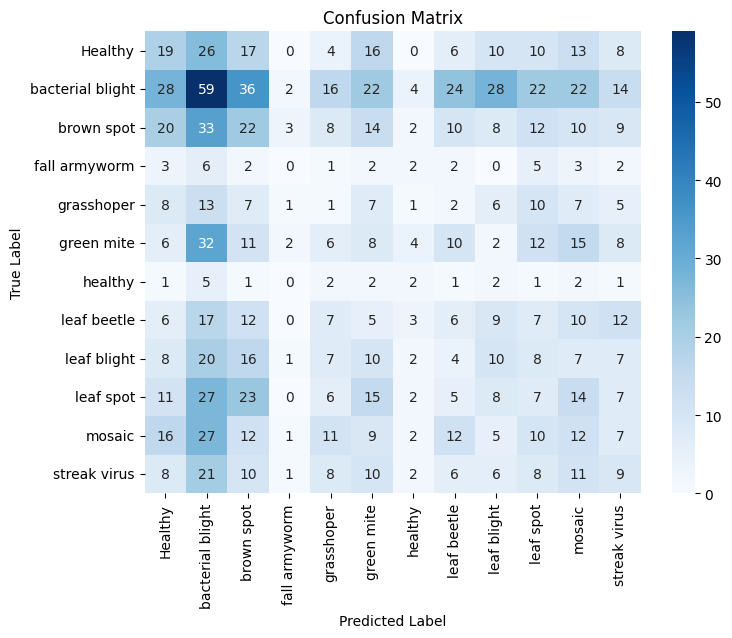

In [31]:
# Get the true labels
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())  # Class labels

# Predict on the test set
predictions = VGG16_model2.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Generate classification report
print("Classification Report:")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# Generate confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

## VGG16 on 30 epochs using earlty stopping techniques

In [32]:
# Load pre-trained VGG16 model without the top layer for transfer learning
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Freeze the base model layers
base_model.trainable = False
# Freeze the base model layers
base_model.trainable = False

# Build the model by adding custom layers on top of VGG16
VGG16_model3 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(len(train_df['class'].unique()), activation='softmax')  # Number of classes
])

# Compile the model
VGG16_model3.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Define callbacks
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)

# Train the model
VGG16_history3 = VGG16_model3.fit(train_generator, epochs=30, validation_data=valid_generator,
                    callbacks=[checkpoint, early_stopping])

# Evaluate the model on the test set
test_loss, test_accuracy = VGG16_model3.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy:.4f}")

Epoch 1/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3810 - loss: 1.8282
Epoch 1: val_loss improved from inf to 1.02530, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 543s 2s/step - accuracy: 0.3813 - loss: 1.8273 - val_accuracy: 0.6612 - val_loss: 1.0253
Epoch 2/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6023 - loss: 1.1553
Epoch 2: val_loss improved from 1.02530 to 0.90510, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 535s 2s/step - accuracy: 0.6023 - loss: 1.1552 - val_accuracy: 0.6905 - val_loss: 0.9051
Epoch 3/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6312 - loss: 1.0383
Epoch 3: val_loss improved from 0.90510 to 0.81028, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 540s 2s/step - accuracy: 0.6313 - loss: 1.0383 - val_accuracy: 0.7145 - val_loss: 0.8103
Epoch 4/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6572 - loss: 0.9751
Epoch 4: val_loss improved from 0.81028 to 0.77463, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 538s 2s/step - accuracy: 0.6572 - loss: 0.9751 - val_accuracy: 0.7288 - val_loss: 0.7746
Epoch 5/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6581 - loss: 0.9529
Epoch 5: val_loss improved from 0.77463 to 0.73372, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 534s 2s/step - accuracy: 0.6581 - loss: 0.9528 - val_accuracy: 0.7415 - val_loss: 0.7337
Epoch 6/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6794 - loss: 0.8896
Epoch 6: val_loss improved from 0.73372 to 0.71553, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 535s 2s/step - accuracy: 0.6793 - loss: 0.8896 - val_accuracy: 0.7415 - val_loss: 0.7155
Epoch 7/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6857 - loss: 0.8795
Epoch 7: val_loss did not improve from 0.71553
333/333 ━━━━━━━━━━━━━━━━━━━━ 534s 2s/step - accuracy: 0.6857 - loss: 0.8795 - val_accuracy: 0.7438 - val_loss: 0.7213
Epoch 8/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6857 - loss: 0.8661
Epoch 8: val_loss did not improve from 0.71553
333/333 ━━━━━━━━━━━━━━━━━━━━ 532s 2s/step - accuracy: 0.6857 - loss: 0.8661 - val_accuracy: 0.7325 - val_loss: 0.7158
Epoch 9/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6866 - loss: 0.8417
Epoch 9: val_loss improved from 0.71553 to 0.67339, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 535s 2s/step - accuracy: 0.6866 - loss: 0.8417 - val_accuracy: 0.7573 - val_loss: 0.6734
Epoch 10/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6962 - loss: 0.8417
Epoch 10: val_loss did not improve from 0.67339
333/333 ━━━━━━━━━━━━━━━━━━━━ 559s 2s/step - accuracy: 0.6962 - loss: 0.8417 - val_accuracy: 0.7468 - val_loss: 0.6929
Epoch 11/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6963 - loss: 0.8340
Epoch 11: val_loss did not improve from 0.67339
333/333 ━━━━━━━━━━━━━━━━━━━━ 536s 2s/step - accuracy: 0.6963 - loss: 0.8340 - val_accuracy: 0.7438 - val_loss: 0.6810
Epoch 12/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6918 - loss: 0.8329
Epoch 12: val_loss did not improve from 0.67339
333/333 ━━━━━━━━━━━━━━━━━━━━ 530s 2s/step - accuracy: 0.6918 - loss: 0.8329 - val_accuracy: 0.7506 - val_loss: 0.6767
Epoch 13/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7023 - loss: 0.8107
Epoch 13: val_loss did not improve from 

333/333 ━━━━━━━━━━━━━━━━━━━━ 563s 2s/step - accuracy: 0.7077 - loss: 0.7844 - val_accuracy: 0.7618 - val_loss: 0.6484
Epoch 15/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7108 - loss: 0.7731
Epoch 15: val_loss improved from 0.64842 to 0.64131, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 788s 2s/step - accuracy: 0.7108 - loss: 0.7731 - val_accuracy: 0.7656 - val_loss: 0.6413
Epoch 16/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7087 - loss: 0.7840
Epoch 16: val_loss did not improve from 0.64131
333/333 ━━━━━━━━━━━━━━━━━━━━ 746s 2s/step - accuracy: 0.7087 - loss: 0.7840 - val_accuracy: 0.7603 - val_loss: 0.6455
Epoch 17/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7178 - loss: 0.7757
Epoch 17: val_loss improved from 0.64131 to 0.63367, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 510s 2s/step - accuracy: 0.7178 - loss: 0.7757 - val_accuracy: 0.7701 - val_loss: 0.6337
Epoch 18/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7132 - loss: 0.7755
Epoch 18: val_loss did not improve from 0.63367
333/333 ━━━━━━━━━━━━━━━━━━━━ 508s 2s/step - accuracy: 0.7132 - loss: 0.7755 - val_accuracy: 0.7521 - val_loss: 0.6733
Epoch 19/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7261 - loss: 0.7565
Epoch 19: val_loss improved from 0.63367 to 0.62127, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 509s 2s/step - accuracy: 0.7261 - loss: 0.7565 - val_accuracy: 0.7686 - val_loss: 0.6213
Epoch 20/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7219 - loss: 0.7512
Epoch 20: val_loss did not improve from 0.62127
333/333 ━━━━━━━━━━━━━━━━━━━━ 510s 2s/step - accuracy: 0.7219 - loss: 0.7512 - val_accuracy: 0.7648 - val_loss: 0.6386
Epoch 21/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7266 - loss: 0.7308
Epoch 21: val_loss improved from 0.62127 to 0.61805, saving model to best_model.h5


333/333 ━━━━━━━━━━━━━━━━━━━━ 511s 2s/step - accuracy: 0.7266 - loss: 0.7308 - val_accuracy: 0.7701 - val_loss: 0.6180
Epoch 22/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7277 - loss: 0.7300
Epoch 22: val_loss did not improve from 0.61805
333/333 ━━━━━━━━━━━━━━━━━━━━ 511s 2s/step - accuracy: 0.7277 - loss: 0.7300 - val_accuracy: 0.7693 - val_loss: 0.6233
Epoch 23/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7311 - loss: 0.7410
Epoch 23: val_loss did not improve from 0.61805
333/333 ━━━━━━━━━━━━━━━━━━━━ 535s 2s/step - accuracy: 0.7310 - loss: 0.7410 - val_accuracy: 0.7566 - val_loss: 0.6474
Epoch 24/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7274 - loss: 0.7551
Epoch 24: val_loss did not improve from 0.61805
333/333 ━━━━━━━━━━━━━━━━━━━━ 510s 2s/step - accuracy: 0.7274 - loss: 0.7551 - val_accuracy: 0.7543 - val_loss: 0.6844
Epoch 25/30
333/333 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7250 - loss: 0.7333
Epoch 25: val_loss did not improve from 

## Training and validation accuraacy, loss on 30 epochs

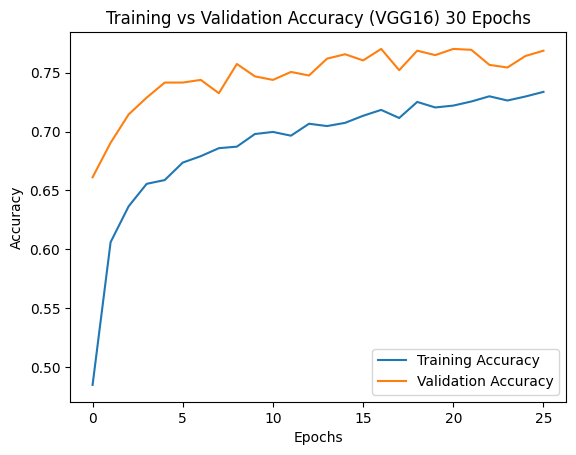

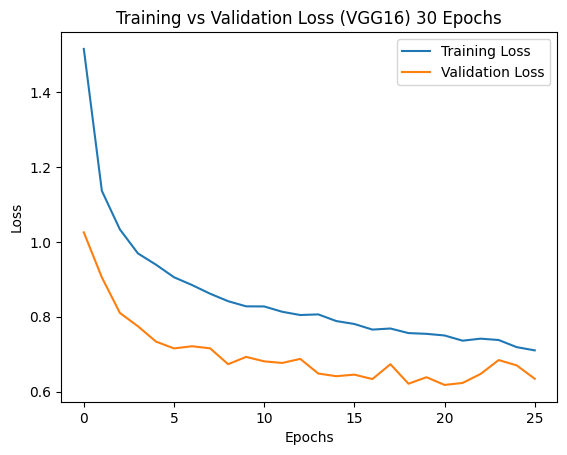

In [33]:
# Plot the training and validation accuracy
plt.plot(VGG16_history3.history['accuracy'], label='Training Accuracy')
plt.plot(VGG16_history3.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training vs Validation Accuracy (VGG16) 30 Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot the training and validation loss
plt.plot(VGG16_history3.history['loss'], label='Training Loss')
plt.plot(VGG16_history3.history['val_loss'], label='Validation Loss')
plt.title('Training vs Validation Loss (VGG16) 30 Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Model evaluation for VGG16 on 30 epochs

42/42 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step
Classification Report:
                  precision    recall  f1-score   support

         Healthy       0.09      0.09      0.09       129
bacterial blight       0.22      0.24      0.23       277
      brown spot       0.09      0.09      0.09       151
   fall armyworm       0.00      0.00      0.00        28
      grasshoper       0.05      0.04      0.05        68
      green mite       0.06      0.07      0.07       116
         healthy       0.00      0.00      0.00        20
     leaf beetle       0.08      0.07      0.08        94
     leaf blight       0.06      0.07      0.06       100
       leaf spot       0.07      0.06      0.06       125
          mosaic       0.08      0.08      0.08       124
    streak virus       0.07      0.07      0.07       100

        accuracy                           0.11      1332
       macro avg       0.07      0.07      0.07      1332
    weighted avg       0.10      0.11      0.10      1332



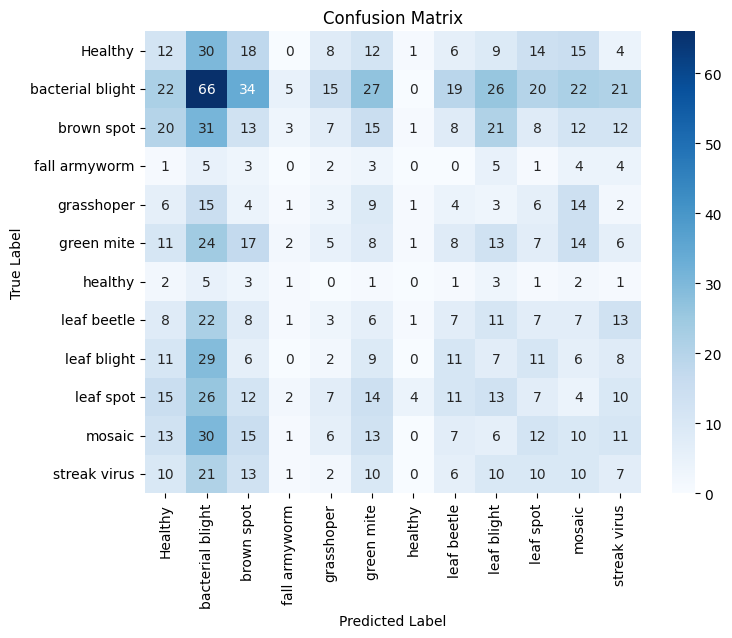

In [34]:
# Get the true labels
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())  # Class labels

# Predict on the test set
predictions = VGG16_model3.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Generate classification report
print("Classification Report:")
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# Generate confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

## Algorithm comparison for 3 VGG16 epochs without early stopping

42/42 ━━━━━━━━━━━━━━━━━━━━ 56s 1s/step
Classification Report (10 Epochs):
                  precision    recall  f1-score   support

         Healthy       0.07      0.07      0.07       129
bacterial blight       0.23      0.23      0.23       277
      brown spot       0.12      0.15      0.13       151
   fall armyworm       0.06      0.04      0.04        28
      grasshoper       0.05      0.04      0.05        68
      green mite       0.07      0.08      0.07       116
         healthy       0.00      0.00      0.00        20
     leaf beetle       0.04      0.04      0.04        94
     leaf blight       0.07      0.08      0.07       100
       leaf spot       0.08      0.06      0.07       125
          mosaic       0.10      0.09      0.10       124
    streak virus       0.08      0.08      0.08       100

        accuracy                           0.11      1332
       macro avg       0.08      0.08      0.08      1332
    weighted avg       0.11      0.11      0.11      1

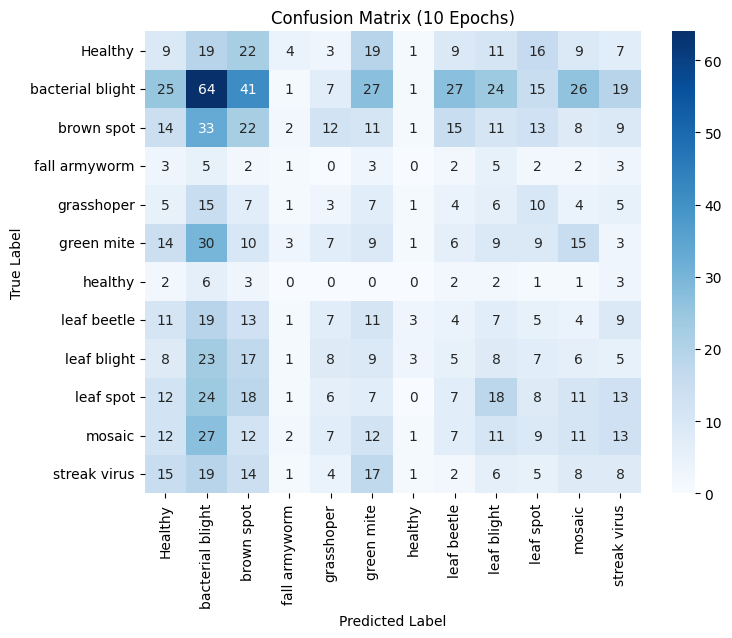

42/42 ━━━━━━━━━━━━━━━━━━━━ 56s 1s/step
Classification Report (20 Epochs):
                  precision    recall  f1-score   support

         Healthy       0.05      0.05      0.05       129
bacterial blight       0.19      0.19      0.19       277
      brown spot       0.08      0.09      0.09       151
   fall armyworm       0.00      0.00      0.00        28
      grasshoper       0.01      0.01      0.01        68
      green mite       0.07      0.07      0.07       116
         healthy       0.04      0.05      0.04        20
     leaf beetle       0.10      0.10      0.10        94
     leaf blight       0.09      0.08      0.08       100
       leaf spot       0.11      0.10      0.10       125
          mosaic       0.07      0.07      0.07       124
    streak virus       0.13      0.12      0.13       100

        accuracy                           0.10      1332
       macro avg       0.08      0.08      0.08      1332
    weighted avg       0.10      0.10      0.10      1

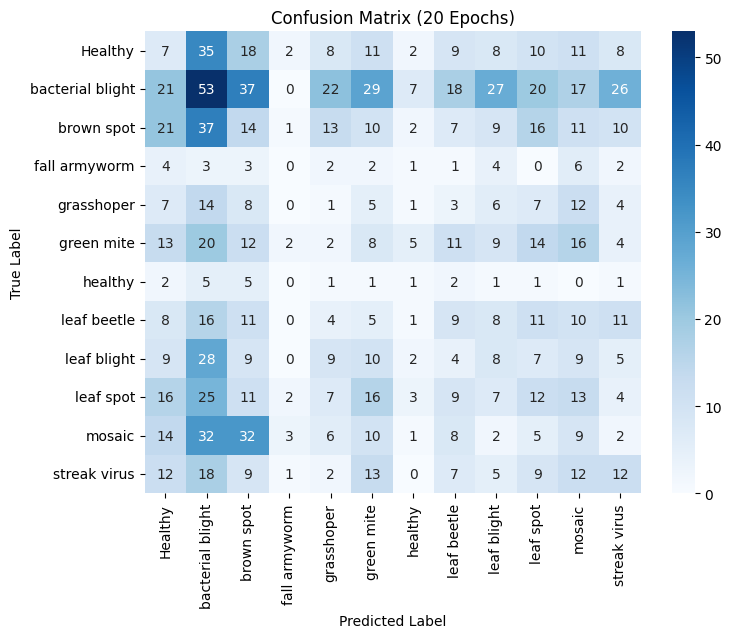

42/42 ━━━━━━━━━━━━━━━━━━━━ 56s 1s/step
Classification Report (30 Epochs):
                  precision    recall  f1-score   support

         Healthy       0.08      0.08      0.08       129
bacterial blight       0.19      0.21      0.20       277
      brown spot       0.12      0.11      0.11       151
   fall armyworm       0.00      0.00      0.00        28
      grasshoper       0.08      0.07      0.08        68
      green mite       0.09      0.10      0.10       116
         healthy       0.00      0.00      0.00        20
     leaf beetle       0.07      0.06      0.07        94
     leaf blight       0.08      0.10      0.09       100
       leaf spot       0.12      0.10      0.11       125
          mosaic       0.07      0.07      0.07       124
    streak virus       0.09      0.09      0.09       100

        accuracy                           0.11      1332
       macro avg       0.08      0.08      0.08      1332
    weighted avg       0.11      0.11      0.11      1

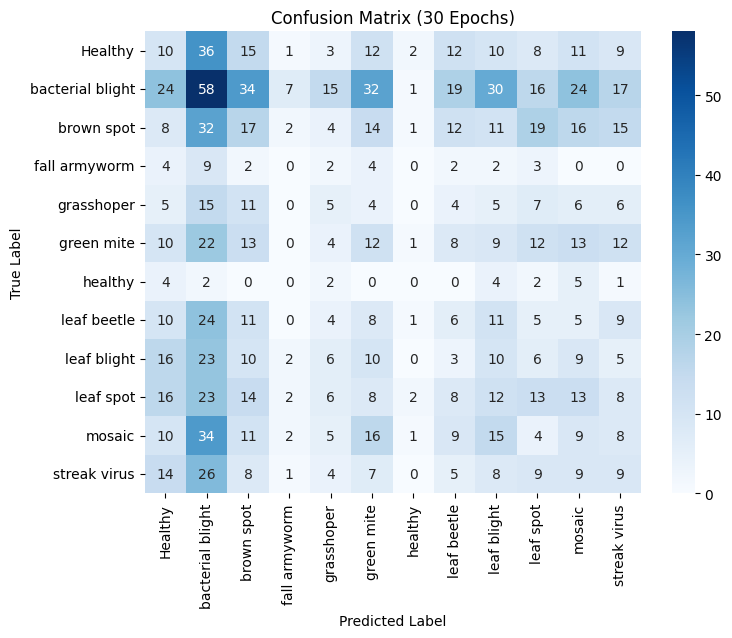

In [35]:
# Function to evaluate and plot results
def evaluate_model(model, generator, epochs_label):
    true_classes = generator.classes
    class_labels = list(generator.class_indices.keys())

    predictions = model.predict(generator)
    predicted_classes = np.argmax(predictions, axis=1)

    print(f"Classification Report ({epochs_label} Epochs):")
    print(classification_report(true_classes, predicted_classes, target_names=class_labels))

    conf_matrix = confusion_matrix(true_classes, predicted_classes)

    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"Confusion Matrix ({epochs_label} Epochs)")
    plt.show()

# Evaluate VGG16 models
evaluate_model(VGG16_model1, test_generator, "10")  # For 10 epochs
evaluate_model(VGG16_model2, test_generator, "20")  # For 20 epochs
evaluate_model(VGG16_model3, test_generator, "30")  # For 30 epochs

## Algorithm Chart comparison of vgg16 on 10,20,30 epochs

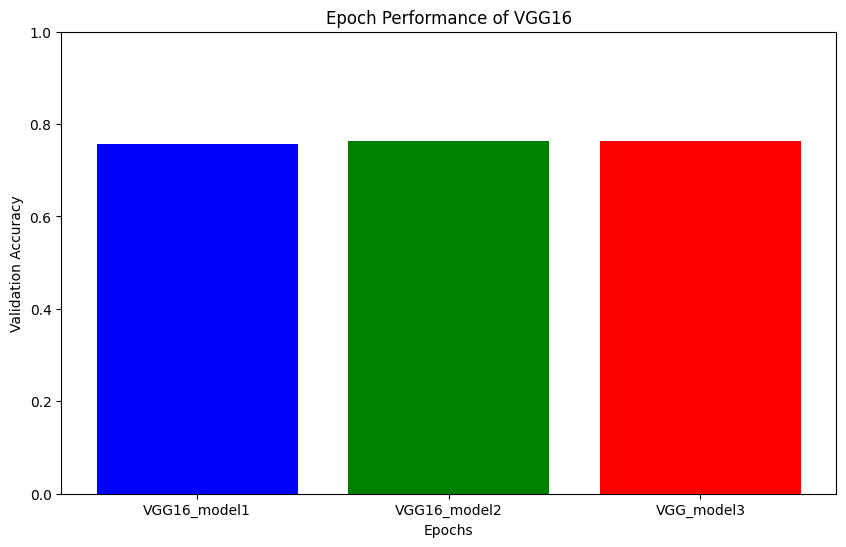

In [37]:
# Code to compare the cnn epoch performance of 10, 20, 30
accuracy_scores = [
    VGG16_history1.history['val_accuracy'][-1],  # Accuracy after 10 epochs
    VGG16_history2.history['val_accuracy'][-1], # Accuracy after 20 epochs
    VGG16_history2.history['val_accuracy'][-1]  # Accuracy after 30 epochs
]

algorithms = ['VGG16_model1', 'VGG16_model2', 'VGG_model3']

plt.figure(figsize=(10, 6))
plt.bar(algorithms, accuracy_scores, color=['blue', 'green', 'red'])
plt.xlabel('Epochs')
plt.ylabel('Validation Accuracy')
plt.title('Epoch Performance of VGG16')
plt.ylim([0, 1])
plt.show()